<a href="https://colab.research.google.com/github/DSabarish/content-based-recommender-system/blob/main/Product_Recommendation_Model_using_Content_Based_Filtering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b><font color='blue'>Product Recommendation Model using Content-Based Filtering</font></b></h1>


## <b>Introduction</b>

This **IPython notebook** introduces a robust **Product Recommendation Model** aimed at optimizing user engagement on e-commerce platforms like **Amazon** and **Flipkart**. Recommendation systems typically utilize two main approaches:

## <b>Methods of Recommendation</b>

>### <b>Content-Based Filtering</b>
In a **content-based recommendation system**, product recommendations are generated based on the **attributes** of the products themselves, such as **textual descriptions** or **image features**. This approach ensures that products similar in content to those searched or viewed by the user are suggested.

>### <b>Collaborative Filtering</b>
**Collaborative filtering**, another widely used method, relies on **user behavior data**. It suggests items based on the preferences and behavior patterns of similar users. However, due to data constraints in this project, I focus exclusively on **content-based recommendation**.


---


### [4.3] Overview of the data

In [ ]:
# Import All Necessary Packages

import gdown
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings

from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os

from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [ ]:
# Google Drive URL
url = "https://drive.google.com/file/d/1y3tPyepPOweL1oez05g1O_bAZZShiaoZ/view?usp=drive_link"

# Extract the file ID from the URL
file_id = url.split('/')[5]
download_url = f'https://drive.google.com/uc?id={file_id}'

# Download the file
output = 'tops_fashion.json'
gdown.download(download_url, output, quiet=False)
"Download Successfull"

Downloading...
From (original): https://drive.google.com/uc?id=1y3tPyepPOweL1oez05g1O_bAZZShiaoZ
From (redirected): https://drive.google.com/uc?id=1y3tPyepPOweL1oez05g1O_bAZZShiaoZ&confirm=t&uuid=2dbcdd8a-c1bd-4635-b1e4-886f734488e3
To: /content/tops_fashion.json
100%|██████████| 263M/263M [00:01<00:00, 150MB/s]


'Download Successfull'

In [ ]:
data = pd.read_json(output)
"Data Loaded Successfully"

'Data Loaded Successfully'

In [ ]:
print(f"Number of data points: {data.shape[0]}")
print(f"Number of features/variables: {data.shape[1]}")

Number of data points: 183138
Number of features/variables: 19


### **Terminology:**
- **Dataset:** A collection of data points or observations.
- **Rows and columns:** The rows represent individual data points, while columns represent variables or features describing each data point.
- **Data-point:** A single instance or observation within a dataset.
- **Feature/variable:** A measurable property or characteristic of a data-point, stored in columns.


In [ ]:
# Each product/item has 19 features in the raw dataset
print("Number of features per product/item:", data.shape[1])
print("Column names (feature names) and data types:")
print(data.info())

Number of features per product/item: 19
Column names (feature names) and data types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183138 entries, 0 to 183137
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   sku                363 non-null     object
 1   asin               183138 non-null  object
 2   product_type_name  183138 non-null  object
 3   formatted_price    28395 non-null   object
 4   author             1 non-null       object
 5   color              64956 non-null   object
 6   brand              182987 non-null  object
 7   publisher          42899 non-null   object
 8   availability       24532 non-null   object
 9   reviews            183138 non-null  object
 10  large_image_url    183138 non-null  object
 11  availability_type  24559 non-null   object
 12  small_image_url    183138 non-null  object
 13  editorial_review   2758 non-null    object
 14  title              183138 non-n

**Features:**

Of these 19 features, we will be using only 6 features in this analysis and modeling:

1. **asin**: Amazon Standard Identification Number
2. **brand**: Brand to which the product belongs
3. **color**: Color information of the apparel (can contain multiple colors)
4. **product_type_name**: Type of the apparel (e.g., SHIRT, TSHIRT)
5. **medium_image_url**: URL of the product image
6. **title**: Title of the product
7. **formatted_price**: Price of the product


In [ ]:
# List of columns to extract
columns_to_extract = ['asin', 'brand', 'color', 'medium_image_url',
                      'product_type_name', 'title', 'formatted_price']



# Extracting specified columns from the DataFrame
data = data[columns_to_extract]
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


In [ ]:
print(f"Number of data points: {data.shape[0]}")
print(f"Number of features/variables: {data.shape[1]}")

Number of data points: 183138
Number of features/variables: 7


### [5.1] Missing data for various features.

In [ ]:
def describe_feature(df, column_name):
    """
    Describe the given feature with various statistics and details.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing the feature to analyze.
    - column_name: str, the name of the column (feature) to analyze.

    Returns:
    - None (outputs results directly).
    """
    # Extract the feature (column) from the DataFrame
    feature = df[column_name]

    # Calculate top group statistics
    top_group = feature.mode().iloc[0]
    top_group_count = feature.value_counts().max()
    total_count = df.shape[0]
    top_group_percentage = (top_group_count / total_count) * 100

    # Display top 10 values and their counts
    print("\nTop 10 values and their counts:")
    print(feature.value_counts().head(10))

    # Display percentage of items from top group
    print(f"\n◼ {top_group_percentage:.2f}% of items are from the '{top_group}' group.")

    # Display number of unique values
    unique_values_count = feature.nunique()
    print(f"◼ Number of unique values: {unique_values_count}")

    # Display number of null values
    null_values_count = feature.isnull().sum()
    null_percentage = (null_values_count / df.shape[0]) * 100
    print(f"◼ Number of null values: {null_values_count} ({null_percentage:.2f}% of total)")

# Example usage:
# Assuming 'data' is your DataFrame and 'brand' is the column of interest
# describe_feature(data, 'brand')


####  Basic stats for the feature: product_type_name

In [ ]:
describe_feature(data, 'product_type_name')


Top 10 values and their counts:
product_type_name
SHIRT                         167794
APPAREL                         3549
BOOKS_1973_AND_LATER            3336
DRESS                           1584
SPORTING_GOODS                  1281
SWEATER                          837
OUTERWEAR                        796
OUTDOOR_RECREATION_PRODUCT       729
ACCESSORY                        636
UNDERWEAR                        425
Name: count, dtype: int64

◼ 91.62% of items are from the 'SHIRT' group.
◼ Number of unique values: 72
◼ Number of null values: 0 (0.00% of total)


In [ ]:
# Names of different product types
data['product_type_name'].unique()

array(['SHIRT', 'SWEATER', 'APPAREL', 'OUTDOOR_RECREATION_PRODUCT',
       'BOOKS_1973_AND_LATER', 'PANTS', 'HAT', 'SPORTING_GOODS', 'DRESS',
       'UNDERWEAR', 'SKIRT', 'OUTERWEAR', 'BRA', 'ACCESSORY',
       'ART_SUPPLIES', 'SLEEPWEAR', 'ORCA_SHIRT', 'HANDBAG',
       'PET_SUPPLIES', 'SHOES', 'KITCHEN', 'ADULT_COSTUME',
       'HOME_BED_AND_BATH', 'MISC_OTHER', 'BLAZER',
       'HEALTH_PERSONAL_CARE', 'TOYS_AND_GAMES', 'SWIMWEAR',
       'CONSUMER_ELECTRONICS', 'SHORTS', 'HOME', 'AUTO_PART',
       'OFFICE_PRODUCTS', 'ETHNIC_WEAR', 'BEAUTY',
       'INSTRUMENT_PARTS_AND_ACCESSORIES', 'POWERSPORTS_PROTECTIVE_GEAR',
       'SHIRTS', 'ABIS_APPAREL', 'AUTO_ACCESSORY', 'NONAPPARELMISC',
       'TOOLS', 'BABY_PRODUCT', 'SOCKSHOSIERY',
       'POWERSPORTS_RIDING_SHIRT', 'EYEWEAR', 'SUIT', 'OUTDOOR_LIVING',
       'POWERSPORTS_RIDING_JACKET', 'HARDWARE', 'SAFETY_SUPPLY',
       'ABIS_DVD', 'VIDEO_DVD', 'GOLF_CLUB', 'MUSIC_POPULAR_VINYL',
       'HOME_FURNITURE_AND_DECOR', 'TABLET_COMPUTER',

####  Basic stats for the feature: brand

In [ ]:
describe_feature(data, 'brand')


Top 10 values and their counts:
brand
Zago                         223
XQS                          222
Yayun                        215
YUNY                         198
XiaoTianXin-women clothes    193
Generic                      192
Boohoo                       190
Alion                        188
Abetteric                    187
TheMogan                     187
Name: count, dtype: int64

◼ 0.12% of items are from the 'Zago' group.
◼ Number of unique values: 10577
◼ Number of null values: 151 (0.08% of total)


####  Basic stats for the feature: color

In [ ]:
describe_feature(data, 'color')


Top 10 values and their counts:
color
Black    13207
White     8616
Blue      3570
Red       2289
Pink      1842
Grey      1499
*         1388
Green     1258
Multi     1203
Gray      1189
Name: count, dtype: int64

◼ 7.21% of items are from the 'Black' group.
◼ Number of unique values: 7380
◼ Number of null values: 118182 (64.53% of total)


####  Basic stats for the feature: formatted_price

In [ ]:
describe_feature(data, 'formatted_price')


Top 10 values and their counts:
formatted_price
$19.99    945
$9.99     749
$9.50     601
$14.99    472
$7.50     463
$24.99    414
$29.99    370
$8.99     343
$9.01     336
$16.99    317
Name: count, dtype: int64

◼ 0.52% of items are from the '$19.99' group.
◼ Number of unique values: 3135
◼ Number of null values: 154743 (84.50% of total)


#### Basic stats for the feature: title


In [ ]:
# All products have a title.
# Titles are typically descriptive of the product.
# Titles are used extensively because they are concise and informative.

describe_feature(data, 'title')


Top 10 values and their counts:
title
Nakoda Cotton Self Print Straight Kurti For Women                                77
Q-rious Women's Racerback Cotton Lycra Camsioles                                 56
FINEJO Casual Women Long Sleeve Lace Irregular Hem Blouse Tops                   47
Girlzwalk Women Cami Sleeveless Printed Swing Vest Top Plus Sizes                44
ELINA FASHION Women's Indo-Western Tunic Top Cotton Kurti                        43
Victoria Scoop Neck Front Lace Floral High-Low Top in 4 Sizes                    40
Cenizas Women's Indian Tunic Top Cotton Kurti                                    39
Indistar Womens Premium Cotton Half Sleeves Printed T-Shirts/Tops (Pack of 3)    37
Rajnandini Women's Cotton Printed Kurti                                          35
Long Sleeve Mock Neck Top                                                        32
Name: count, dtype: int64

◼ 0.04% of items are from the 'Nakoda Cotton Self Print Straight Kurti For Women' group.
◼ Num

In [ ]:
# Create a directory for pickle files if it doesn't exist
pickle_folder = 'pickles'
os.makedirs(pickle_folder, exist_ok=True)

In [ ]:
# Save DataFrame to pickle file
data.to_pickle(os.path.join(pickle_folder, '180k_apparel_data.pkl'))
print(f"DataFrame saved as '180k_apparel_data.pkl' in '{pickle_folder}' folder.")

DataFrame saved as '180k_apparel_data.pkl' in 'pickles' folder.


In [ ]:
# We save data files at every major step in our processing as "pickle" files.
# If you are stuck or if some code takes too long to run on your laptop,
# you may use the pickle files we provide to speed things up.

# Load DataFrame from pickle file
data = pd.read_pickle('pickles/180k_apparel_data.pkl')
"pickle Loaded"

'pickle Loaded'

In [ ]:
# Include only products with available price information.
# data['formatted_price'].isnull() identifies rows where price is None or Null.
# Exclude rows where price is Null.

data = data[data['formatted_price'].notnull()]
print('Number of data points after removing price=NULL:', data.shape[0])


Number of data points after removing price=NULL: 28395


In [ ]:
# Consider products with color information.
# Filter out rows where color is Null using data['color'].notnull().

data = data[data['color'].notnull()]
print('Number of data points after filtering out color=NULL:', data.shape[0])

Number of data points after filtering out color=NULL: 28385


✅ We've reduced the dataset from 183K to 28K points. <br>
✅ This change ensures most workshop participants can run the code on their laptops in a reasonable time.<br>
✅ For those with powerful computers and more time, using all 183K images is recommended.


In [ ]:
# Save DataFrame to pickle file
data.to_pickle(os.path.join(pickle_folder, '28k_apparel_data.pkl'))
print(f"DataFrame saved as '28k_apparel_data.pkl' in '{pickle_folder}' folder.")

DataFrame saved as '28k_apparel_data.pkl' in 'pickles' folder.


In [ ]:
# Load DataFrame from pickle file
data = pd.read_pickle('pickles/28k_apparel_data.pkl')
"pickle Loaded"

'pickle Loaded'

In [ ]:
data.columns

Index(['asin', 'brand', 'color', 'medium_image_url', 'product_type_name',
       'title', 'formatted_price'],
      dtype='object')

In [ ]:

# '''
# from PIL import Image
# import requests
# from io import BytesIO

# for index, row in images.iterrows():
#         url = row['medium_image_url']
#         response = requests.get(url)
#         img = Image.open(BytesIO(response.content))
#         img.save('images/28k_images/'+row['asin']+'.jpeg')


# '''

### [5.2] Remove near duplicate items

#### [5.2.1] Understand about duplicates.

In [ ]:
data = pd.read_pickle('pickles/28k_apparel_data.pkl')                                              # Read data from the pickle file from the previous stage

duplicate_titles_count = sum(data.duplicated('title'))                                             # Find the number of products that have duplicate titles
print(f"Number of products with duplicate titles: {duplicate_titles_count}")

print(f"We have {duplicate_titles_count} products that have the same title but different colors.") # Output a specific note about the duplicates

Number of products with duplicate titles: 2325
We have 2325 products that have the same title but different colors.


#### These shirts are exactly same, except in size (S, M,L,XL)

<table>
<tr>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00AQ4GMCK.jpeg?raw=1" width="100" height="100"> :B00AQ4GMCK</td>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00AQ4GMTS.jpeg?raw=1" width="100" height="100"> :B00AQ4GMTS</td>
</tr>
<tr>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00AQ4GMLQ.jpeg?raw=1" width="100" height="100"> :B00AQ4GMLQ</td>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00AQ4GN3I.jpeg?raw=1" width="100" height="100"> :B00AQ4GN3I</td>
</tr>
</table>


#### These shirts exactly same except  in color

<table>
<tr>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00G278GZ6.jpeg?raw=1" width="100" height="100"> : B00G278GZ6</td>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00G278W6O.jpeg?raw=1" width="100" height="100"> : B00G278W6O</td>
</tr>
<tr>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00G278Z2A.jpeg?raw=1" width="100" height="100"> : B00G278Z2A</td>
<td><img src="https://github.com/DSabarish/Product-Recommenders--Amazon/blob/main/dedupe/B00G2786X8.jpeg?raw=1" width="100" height="100"> : B00G2786X8</td>
</tr>
</table>


#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


#### [5.2.2] Remove duplicates : Part 1

In [ ]:
# Read data from the pickle file from the previous stage
data = pd.read_pickle('pickles/28k_apparel_data.pkl')
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28385 entries, 4 to 183136
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   asin               28385 non-null  object
 1   brand              28292 non-null  object
 2   color              28385 non-null  object
 3   medium_image_url   28385 non-null  object
 4   product_type_name  28385 non-null  object
 5   title              28385 non-null  object
 6   formatted_price    28385 non-null  object
dtypes: object(7)
memory usage: 1.7+ MB


In [ ]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [ ]:
# Sort the whole data based on title (alphabetical order of title)
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted[:5]

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [ ]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [ ]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:

    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b):
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [ ]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [ ]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [ ]:
# Save DataFrame to pickle file
pickle_folder = 'pickles'  # Ensure this directory exists
data.to_pickle(os.path.join(pickle_folder, '17k_apparel_data.pkl'))
print(f"DataFrame saved as '17k_apparel_data.pkl' in '{pickle_folder}' folder.")

DataFrame saved as '17k_apparel_data.pkl' in 'pickles' folder.


#### [5.2.3] Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [ ]:
# Read data from the pickle file from the previous stage
data = pd.read_pickle('pickles/17k_apparel_data.pkl')
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17593 entries, 4 to 183120
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   asin               17593 non-null  object
 1   brand              17543 non-null  object
 2   color              17593 non-null  object
 3   medium_image_url   17593 non-null  object
 4   product_type_name  17593 non-null  object
 5   title              17593 non-null  object
 6   formatted_price    17593 non-null  object
dtypes: object(7)
memory usage: 1.1+ MB


In [ ]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:

        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']

        length = max(len(a),len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b):
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [ ]:
# from whole previous products we will consider only
# the products that are found in previous cell
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [ ]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16435


In [ ]:
# data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead
# of 180K they can download and use them from the Google Drive folder.
# Save DataFrame to pickle file
pickle_folder = 'pickles'  # Ensure this directory exists
data.to_pickle(os.path.join(pickle_folder, '16k_apperal_data.pkl'))
print(f"DataFrame saved as '16k_apperal_data.pkl' in '{pickle_folder}' folder.")

DataFrame saved as '16k_apperal_data.pkl' in 'pickles' folder.


# 6. Text pre-processing

In [ ]:
# Read data from the pickle file from the previous stage
data = pd.read_pickle('pickles/16k_apperal_data.pkl')
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16435 entries, 4 to 183120
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   asin               16435 non-null  object
 1   brand              16389 non-null  object
 2   color              16435 non-null  object
 3   medium_image_url   16435 non-null  object
 4   product_type_name  16435 non-null  object
 5   title              16435 non-null  object
 6   formatted_price    16435 non-null  object
dtypes: object(7)
memory usage: 1.0+ MB


In [ ]:
# NLTK download stop words. [RUN ONLY ONCE]
# import nltk
# nltk.download()

import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_rus to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |  

True

In [ ]:
## Import necessary libraries from NLTK
from nltk.corpus import stopwords

## Download stopwords from NLTK and create a set of English stopwords
stop_words = set(stopwords.words('english'))
print('List of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    """
    Function to preprocess text data by:
    - Removing special characters
    - Converting text to lowercase
    - Removing stopwords

    Parameters:
    total_text (str): The text to be processed.
    index (int): The index of the row in the dataframe.
    column (str): The column name in the dataframe where the processed text will be stored.
    """
    if isinstance(total_text, str):  # Check if the input text is a string
        processed_text = ""
        for word in total_text.split():
            # Remove special characters from the word
            cleaned_word = "".join(char for char in word if char.isalnum())
            # Convert the word to lowercase
            cleaned_word = cleaned_word.lower()
            # Append the word to the processed text if it's not a stop word
            if cleaned_word not in stop_words:
                processed_text += cleaned_word + " "

        # Assign the processed text to the appropriate column and index in the dataframe
        data.at[index, column] = processed_text.strip()


List of stop words: {'my', 'if', 'other', 'him', 'while', 'more', 'will', 'such', 'during', "shouldn't", 'few', 've', 'where', "shan't", 'nor', 'an', 'how', 'being', 's', 'who', 'not', 'hers', 'they', 't', 'out', "wasn't", 'once', 'here', 'should', 'between', 'after', 'were', 'm', 'those', 'her', 'into', "you've", 'wouldn', 'shan', 'no', 'have', 'the', "hasn't", 'which', 'them', "aren't", 'in', 'above', 'couldn', 'than', 'his', 'very', 'and', 'aren', 'under', 'our', 'himself', 'been', 'any', 'ma', 'down', "couldn't", 'that', 'having', 'is', 'too', 'whom', 'did', 'ourselves', 'mightn', 'there', 'didn', 'themselves', 'yours', 'on', 'a', 'own', 'herself', 're', 'does', 'he', "weren't", 'myself', "mightn't", "it's", 'by', 'll', 'about', 'needn', 'won', 'now', 'she', 'because', 'some', 'when', 'has', 'it', 'hadn', "haven't", "needn't", 'of', 'hasn', 'be', 'these', 'had', 'up', 'why', 'weren', 'so', 'we', 'at', 'off', 'are', 'was', 'y', 'their', 'haven', 'all', 'to', 'each', 'until', 'do', "

In [ ]:
# import time

# Start the timer
start_time = time.perf_counter()

# Text-preprocess each title in the DataFrame
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')

# Record the spot time after preprocessing
spot_time = time.perf_counter()

# Print the time taken to preprocess all titles
elapsed_time = spot_time - start_time
print(f"Time taken to preprocess all titles: {elapsed_time:.2f} seconds")

Time taken to preprocess all titles: 1.30 seconds


In [ ]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [ ]:
# Save DataFrame to pickle file
pickle_folder = 'pickles'  # Ensure this directory exists
data.to_pickle(os.path.join(pickle_folder, '16k_apperal_data_preprocessed.pkl'))
print(f"DataFrame saved as '16k_apperal_data_preprocessed.pkl' in '{pickle_folder}' folder.")

DataFrame saved as '16k_apperal_data_preprocessed.pkl' in 'pickles' folder.


## Stemming

In [ ]:
from nltk.stem.porter import PorterStemmer  # Import PorterStemmer from NLTK

# Initialize the PorterStemmer
stemmer = PorterStemmer()

# Print the stemmed versions of 'arguing' and 'fishing'
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))

# Explanation of stemming not working well with titles
# Tried using stemming on our titles and it did not work very well.

argu
fish


# [8] Text based product similarity

In [ ]:
# Read data from the pickle file from the previous stage
data = pd.read_pickle('pickles/16k_apperal_data_preprocessed.pkl')
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16435 entries, 4 to 183120
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   asin               16435 non-null  object
 1   brand              16389 non-null  object
 2   color              16435 non-null  object
 3   medium_image_url   16435 non-null  object
 4   product_type_name  16435 non-null  object
 5   title              16435 non-null  object
 6   formatted_price    16435 non-null  object
dtypes: object(7)
memory usage: 1.0+ MB


In [ ]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook
    plt.imshow(img)

#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1])
        fig = plt.figure(figsize=(25,3))

        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title

        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])

        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)

        # displays combine figure ( heat map and image together)
        plt.show()

def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models,
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys())

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0
    values = [vec2[x] for x in vec2.keys()]

    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b

    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## [8.2] Bag of Words (BoW) on product titles.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# What is a sparse vector?
# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16435, 12684)

In [ ]:
import requests

def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])

    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
# bag_of_words_model(12566, 20) # change the index if you want to.
# In the output heat map each value represents the count value
# of the label word, the color represents the intersection
# with inputs title.

#try 12566
#try 931

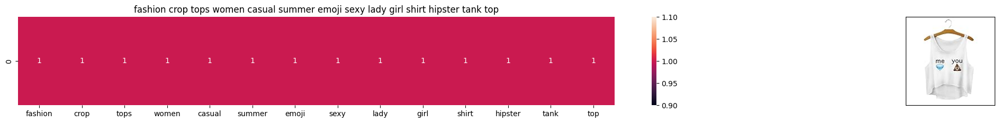

ASIN : B010V3B44G
Brand: Doxi Supermall
Title: fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top
Euclidean similarity with the query image : 0.0


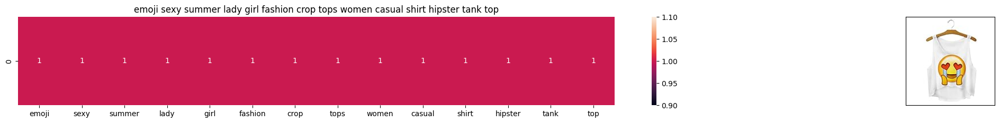

ASIN : B010V3BLWQ
Brand: Doxi Supermall
Title: emoji sexy summer lady girl fashion crop tops women casual shirt hipster tank top
Euclidean similarity with the query image : 0.0


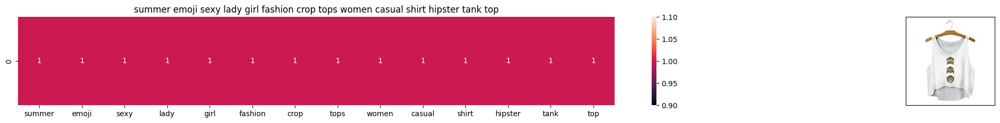

ASIN : B010V3BDII
Brand: Doxi Supermall
Title: summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top
Euclidean similarity with the query image : 0.0


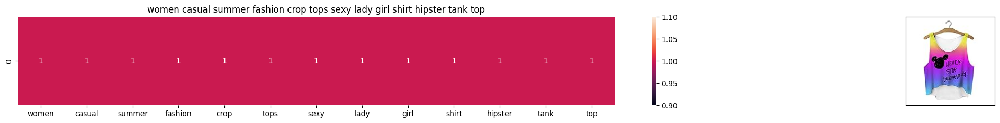

ASIN : B010V3AYSS
Brand: Doxi Supermall
Title: women casual summer fashion crop tops sexy lady girl shirt hipster tank top
Euclidean similarity with the query image : 1.0


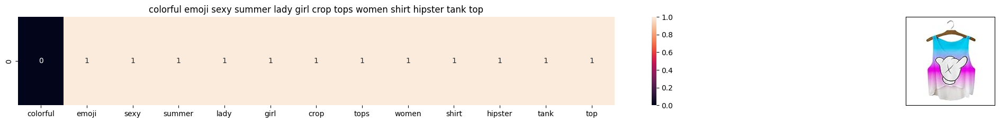

ASIN : B010V3BQZS
Brand: Doxi Supermall
Title: colorful emoji sexy summer lady girl crop tops women shirt hipster tank top
Euclidean similarity with the query image : 1.7320508075688772


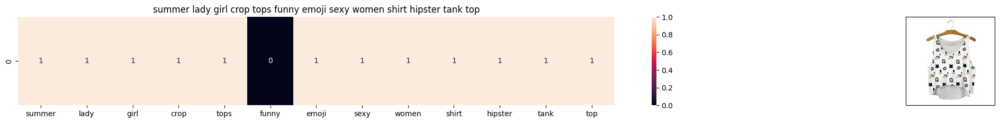

ASIN : B010V3BVMQ
Brand: Doxi Supermall
Title: summer lady girl crop tops funny emoji sexy women shirt hipster tank top
Euclidean similarity with the query image : 1.7320508075688772


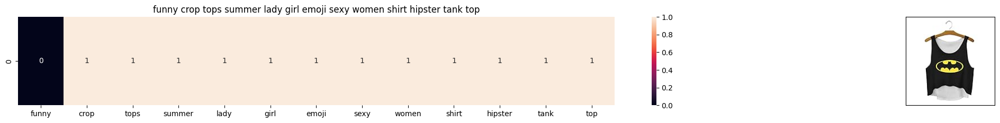

ASIN : B010V3C116
Brand: Doxi Supermall
Title: funny crop tops summer lady girl emoji sexy women shirt hipster tank top
Euclidean similarity with the query image : 1.7320508075688772


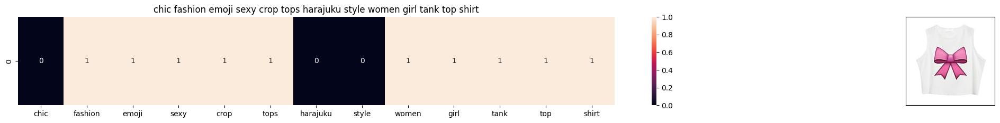

ASIN : B011RCJPR8
Brand: Chiclook Cool
Title: chic fashion emoji sexy crop tops harajuku style women girl tank top shirt
Euclidean similarity with the query image : 2.6457513110645907


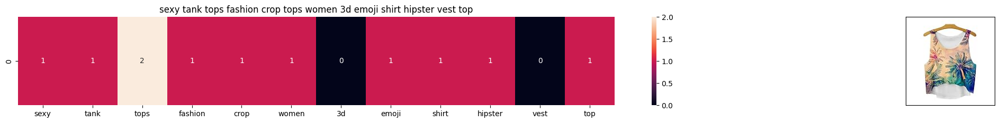

ASIN : B010V3DB9C
Brand: Doxi Supermall
Title: sexy tank tops fashion crop tops women 3d emoji shirt hipster vest top
Euclidean similarity with the query image : 2.6457513110645907


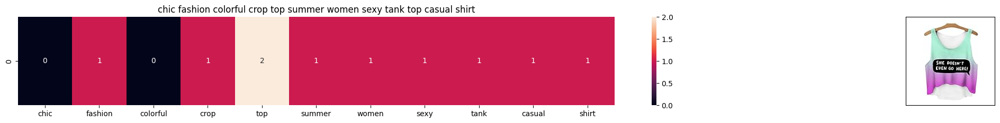

ASIN : B011RCJ6UE
Brand: Chiclook Cool
Title: chic fashion colorful crop top summer women sexy tank top casual shirt
Euclidean similarity with the query image : 2.8284271247461903


In [ ]:
bag_of_words_model(12566, 10)  # Query > fashion crop wmen casual emoji sexy lady girl shirt hipster tank top


## [8.5] TF-IDF based product similarity

#### Key Concepts and Equations

- **Text Representation**: TF-IDF transforms product titles into numerical vectors, reflecting word importance within each title across the dataset. It combines term frequency (TF) and inverse document frequency (IDF).

  $$
  \text{TF-IDF}(t,d) = \text{TF}(t,d) \times \text{IDF}(t)
  $$

  - $\text{TF}(t,d)$: Term frequency of term $t$ in document $d$.
  - $\text{IDF}(t) = \log \left(\frac{N}{|\{d \in D : t \in d\}|}\right)$: Inverse document frequency, where $N$ is the total number of documents and $|\{d \in D : t \in d\}|$ is the number of documents containing term $t$.

<br>
  
- **Cosine Similarity**: Measures the angle between TF-IDF vectors to determine similarity between product titles, ideal for textual comparisons.

  $$
  \cos(\theta) = \frac{\mathbf{A} \cdot \mathbf{B}}{\|\mathbf{A}\| \|\mathbf{B}\|}
  $$

  - $\mathbf{A}$ and $\mathbf{B}$: TF-IDF vectors of two titles.
  - $\mathbf{A} \cdot \mathbf{B}$: Dot product of the vectors.
  - $\|\mathbf{A}\|$ and $\|\mathbf{B}\|$: Magnitudes of the vectors.

<br>
  
- **Finding Similar Products**: Identifies products with the most similar titles by sorting based on cosine distance, where smaller distances indicate higher similarity.

  $$
  \text{Cosine Distance} = 1 - \cos(\theta)
  $$

<br>

- **Practical Application**: Enhances e-commerce recommendations by suggesting similar products, thereby improving user experience and boosting sales through personalized suggestions.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Step 1: Initialize the TfidfVectorizer
# min_df=0.0 means we include all words, even if they appear very rarely
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0.0)

# Step 2: Fit the vectorizer on the 'title' column and transform the text data into TF-IDF features
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])

# Explanation:
# tfidf_title_features is a matrix where:
# - Each row represents a title (a document)
# - Each column represents a unique word from all the titles (the corpus)
# - Each value in the matrix is a TF-IDF score, which measures the importance of a word in a title
#   relative to all the other titles

# Example:
# tfidf_title_features.shape will give you the number of titles (rows) and the number of unique words (columns)
# tfidf_title_features[doc_id, word_index] will give you the TF-IDF score of the word at 'word_index' in the title with 'doc_id'
print(tfidf_title_features.shape)

(16435, 12684)


In [ ]:
from sklearn.metrics import pairwise_distances

def tfidf_model(doc_id, num_results):
    """
    Function to find and display similar products based on TF-IDF features.

    Parameters:
    doc_id (int): The ID of the product in the given corpus.
    num_results (int): The number of similar products to retrieve.
    """

    # Calculate the cosine distance between the given product and all other products
    # The metric used here is cosine distance, which is measured as:
    # K(X, Y) = <X, Y> / (||X|| * ||Y||)
    # Reference: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features, tfidf_title_features[doc_id])

    # Get indices of the 'num_results' smallest distances
    indices = np.argsort(pairwise_dist.flatten())[:num_results]

    # Get the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[:num_results]

    # Get the DataFrame indices of the smallest distances
    df_indices = list(data.index[indices])

    # Display results for the top 'num_results' similar products
    for i in range(len(indices)):
        # We will pass 1. doc_id, 2. title1, 3. title2, 4. url, 5. model
        get_result(indices[i],
                   data['title'].loc[df_indices[0]],
                   data['title'].loc[df_indices[i]],
                   data['medium_image_url'].loc[df_indices[i]],
                   'tfidf'
                  )

        print('ASIN:', data['asin'].loc[df_indices[i]])
        print('Brand:', data['brand'].loc[df_indices[i]])
        print('Title:', data['title'].loc[df_indices[i]])
        print('Cosine distance from the given product:', pdists[i])
        print('=' * 125)

# Example usage:
# tfidf_model(12566, 20)
# In the output heat map, each value represents the TF-IDF values of the label word.
# The color represents the intersection with the input title.

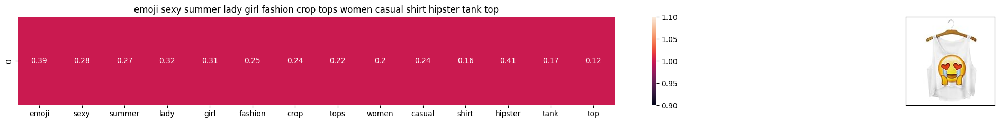

ASIN: B010V3BLWQ
Brand: Doxi Supermall
Title: emoji sexy summer lady girl fashion crop tops women casual shirt hipster tank top
Cosine distance from the given product: 0.0


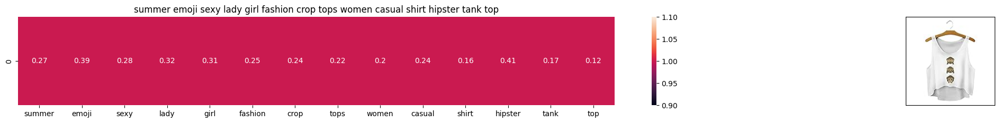

ASIN: B010V3BDII
Brand: Doxi Supermall
Title: summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top
Cosine distance from the given product: 0.0


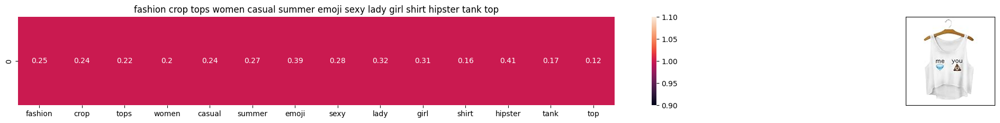

ASIN: B010V3B44G
Brand: Doxi Supermall
Title: fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top
Cosine distance from the given product: 0.0


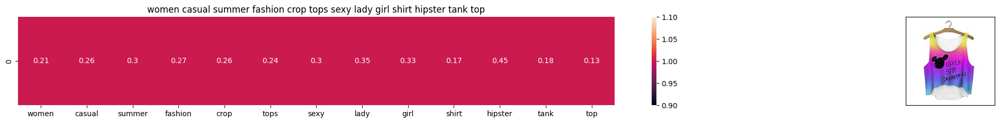

ASIN: B010V3AYSS
Brand: Doxi Supermall
Title: women casual summer fashion crop tops sexy lady girl shirt hipster tank top
Cosine distance from the given product: 0.40138594750235


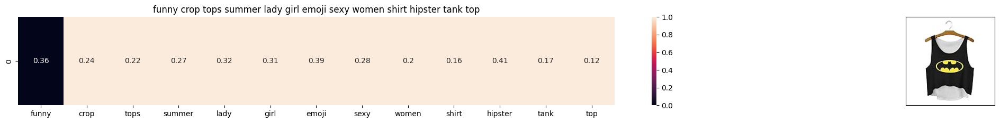

ASIN: B010V3C116
Brand: Doxi Supermall
Title: funny crop tops summer lady girl emoji sexy women shirt hipster tank top
Cosine distance from the given product: 0.49544215538955555


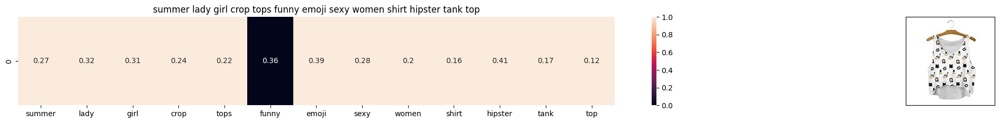

ASIN: B010V3BVMQ
Brand: Doxi Supermall
Title: summer lady girl crop tops funny emoji sexy women shirt hipster tank top
Cosine distance from the given product: 0.49544215538955555


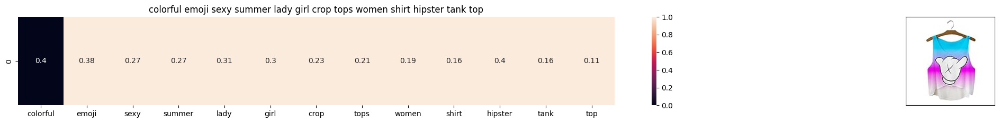

ASIN: B010V3BQZS
Brand: Doxi Supermall
Title: colorful emoji sexy summer lady girl crop tops women shirt hipster tank top
Cosine distance from the given product: 0.5241689140292637


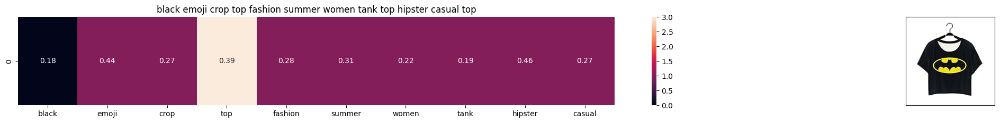

ASIN: B0124E80M4
Brand: Doxi Supermall
Title: black emoji crop top fashion summer women tank top hipster casual top
Cosine distance from the given product: 0.684158162664275


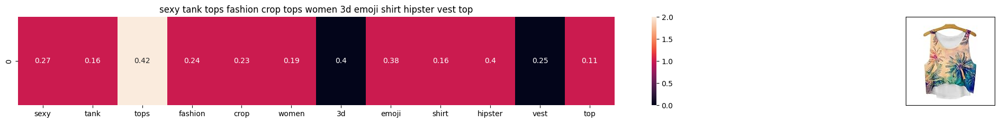

ASIN: B010V3DB9C
Brand: Doxi Supermall
Title: sexy tank tops fashion crop tops women 3d emoji shirt hipster vest top
Cosine distance from the given product: 0.7731343455110792


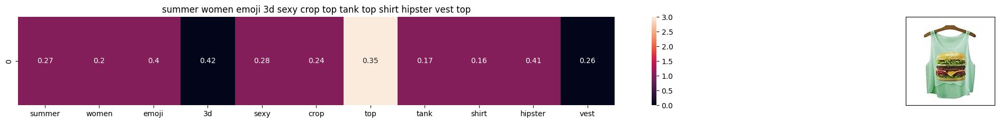

ASIN: B010V3E5EC
Brand: Doxi Supermall
Title: summer women emoji 3d sexy crop top tank top shirt hipster vest top
Cosine distance from the given product: 0.8128754313990525


In [ ]:
tfidf_model(12566, 10)  # Query > fashion crop wmen casual emoji sexy lady girl shirt hipster tank top

## [8.5] IDF based product similarity

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Step 1: Initialize the CountVectorizer
idf_title_vectorizer = CountVectorizer()

# Step 2: Fit the vectorizer on the 'title' column and transform the text data into word count features
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# Explanation:
# idf_title_features is a matrix where:
# - Each row represents a title (a document)
# - Each column represents a unique word from all the titles (the corpus)
# - Each value in the matrix represents the count of a word in a title
#   relative to all the other titles
print("Shape of word count matrix:", idf_title_features.shape)

# Example:
# idf_title_features.shape will give you the number of titles (rows) and the number of unique words (columns)
# idf_title_features[doc_id, word_index] will give you the count of the word at 'word_index' in the title with 'doc_id'


Shape of word count matrix: (16435, 12684)


In [ ]:
import math

def n_containing(word):
    """Return the number of documents containing the given word."""
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    """Calculate the Inverse Document Frequency (IDF) of a word."""
    return math.log(data.shape[0] / (n_containing(word)))



In [ ]:
# Convert the values in idf_title_features to float
idf_title_features = idf_title_features.astype(float)

# Iterate over each word in the vocabulary
for i in idf_title_vectorizer.vocabulary_.keys():
    # Calculate IDF value for the current word
    idf_val = idf(i)

    # Replace the count values with IDF values for the current word across all documents
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will give us indices of documents containing the word i
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        # Replace the count value with the IDF value for the word i in document j
        idf_title_features[j, idf_title_vectorizer.vocabulary_[i]] = idf_val

        # Now idf_title_features[doc_id, index_of_word_in_corpus] contains the IDF value of the word

In [ ]:
def idf_model(doc_id, num_results):
    """
    Function to find and display similar products based on IDF features.

    Parameters:
    doc_id (int): The ID of the product in the given corpus.
    num_results (int): The number of similar products to retrieve.
    """

    # Calculate the cosine distance between the given product and all other products
    # The metric used here is cosine distance, which is measured as:
    # K(X, Y) = <X, Y> / (||X|| * ||Y||)
    # Reference: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features, idf_title_features[doc_id])

    # Get indices of the 'num_results' smallest distances
    indices = np.argsort(pairwise_dist.flatten())[:num_results]

    # Get the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[:num_results]

    # Get the DataFrame indices of the smallest distances
    df_indices = list(data.index[indices])

    # Display results for the top 'num_results' similar products
    for i in range(len(indices)):
        # We will pass 1. doc_id, 2. title1, 3. title2, 4. url, 5. model
        get_result(indices[i],
                   data['title'].loc[df_indices[0]],
                   data['title'].loc[df_indices[i]],
                   data['medium_image_url'].loc[df_indices[i]],
                   'idf'
                  )

        print('ASIN:', data['asin'].loc[df_indices[i]])
        print('Brand:', data['brand'].loc[df_indices[i]])
        print('Title:', data['title'].loc[df_indices[i]])
        print('Cosine distance from the given product:', pdists[i])
        print('=' * 125)

# Example usage:
# idf_model(12566, 20)
# In the output heat map, each value represents the IDF values of the label word.
# The color represents the intersection with the input title.


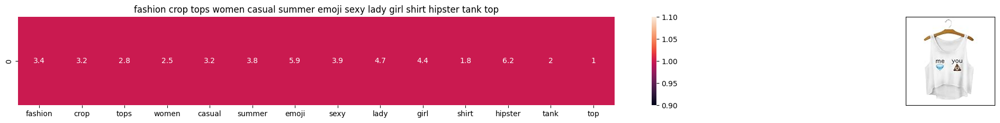

ASIN: B010V3B44G
Brand: Doxi Supermall
Title: fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top
Cosine distance from the given product: 0.0


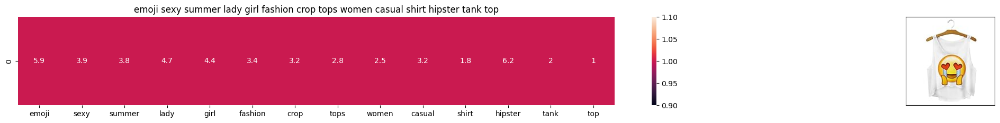

ASIN: B010V3BLWQ
Brand: Doxi Supermall
Title: emoji sexy summer lady girl fashion crop tops women casual shirt hipster tank top
Cosine distance from the given product: 0.0


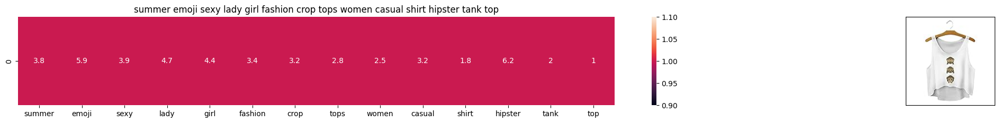

ASIN: B010V3BDII
Brand: Doxi Supermall
Title: summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top
Cosine distance from the given product: 0.0


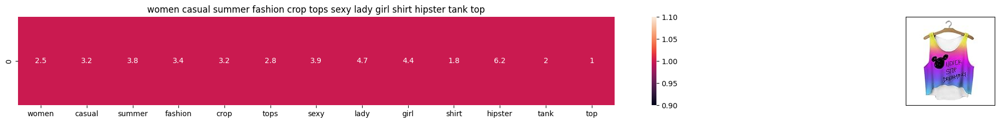

ASIN: B010V3AYSS
Brand: Doxi Supermall
Title: women casual summer fashion crop tops sexy lady girl shirt hipster tank top
Cosine distance from the given product: 5.922978852180059


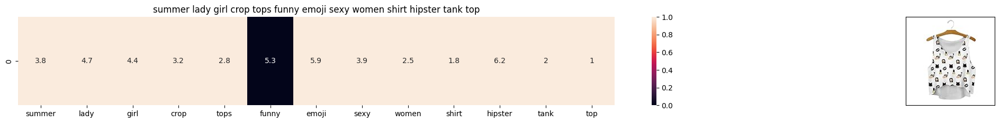

ASIN: B010V3BVMQ
Brand: Doxi Supermall
Title: summer lady girl crop tops funny emoji sexy women shirt hipster tank top
Cosine distance from the given product: 7.037272185298332


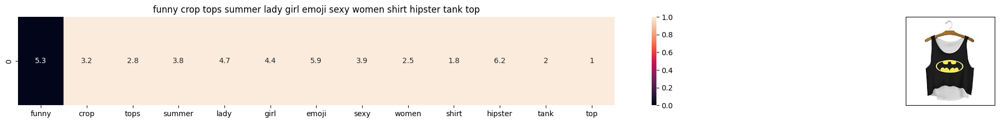

ASIN: B010V3C116
Brand: Doxi Supermall
Title: funny crop tops summer lady girl emoji sexy women shirt hipster tank top
Cosine distance from the given product: 7.037272185298332


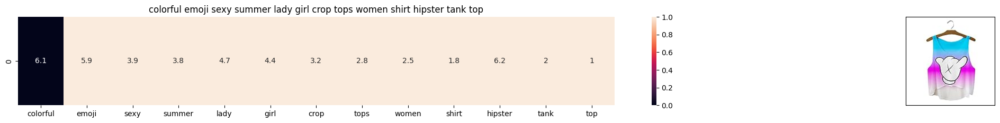

ASIN: B010V3BQZS
Brand: Doxi Supermall
Title: colorful emoji sexy summer lady girl crop tops women shirt hipster tank top
Cosine distance from the given product: 7.667939547088641


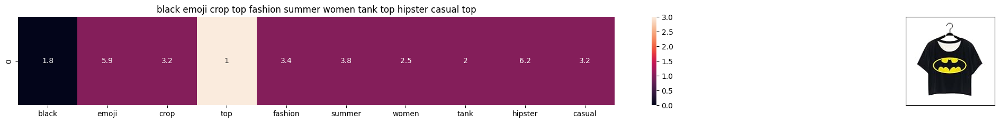

ASIN: B0124E80M4
Brand: Doxi Supermall
Title: black emoji crop top fashion summer women tank top hipster casual top
Cosine distance from the given product: 8.39863603811248


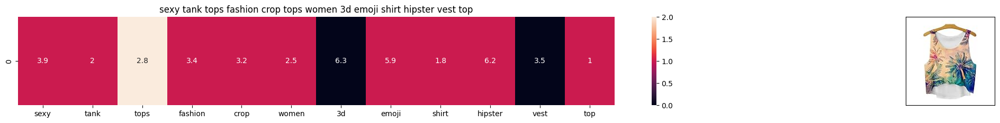

ASIN: B010V3DB9C
Brand: Doxi Supermall
Title: sexy tank tops fashion crop tops women 3d emoji shirt hipster vest top
Cosine distance from the given product: 10.835090137343855


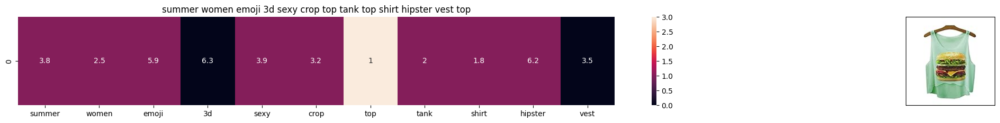

ASIN: B010V3E5EC
Brand: Doxi Supermall
Title: summer women emoji 3d sexy crop top tank top shirt hipster vest top
Cosine distance from the given product: 11.060530175472811


In [ ]:
idf_model(12566, 10)

# [9] Text Semantics based product similarity

In [ ]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.
# Do NOT RUN this code.
# It is meant as a reference to build your own Word2Vec when you have
# lots of data.

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality
min_word_count = 1    # Minimum word count
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)

'''

'\n# Set values for various parameters\nnum_features = 300    # Word vector dimensionality\nmin_word_count = 1    # Minimum word count\nnum_workers = 4       # Number of threads to run in parallel\ncontext = 10          # Context window size\ndownsampling = 1e-3   # Downsample setting for frequent words\n\n# Initialize and train the model (this will take some time)\nfrom gensim.models import word2vec\nprint ("Training model...")\nmodel = word2vec.Word2Vec(sen_corpus, workers=num_workers,             size=num_features, min_count = min_word_count,             window = context)\n\n'

In [ ]:
# pip install setuptools
# import multiprocessing

In [ ]:
# pip install gensim

In [ ]:
import os
import gdown
import pickle

# Function to download file from Google Drive
def download_file_from_google_drive(file_id, dest_path):
    url = f'https://drive.google.com/uc?id={file_id}'
    gdown.download(url, dest_path, quiet=False)

# File ID and destination path
file_id = '12BUaHl7bMHsP14xuXlVr45WsC-7jeQ1o'
dest_path = 'pickles/word2vec_model'

# Create 'pickles' directory if it doesn't exist
os.makedirs('pickles', exist_ok=True)

# Download the file from Google Drive
print(f"Downloading word2vec_model file to {dest_path}...")
download_file_from_google_drive(file_id, dest_path)
print("Download complete.")

# Load the model using pickle
with open(dest_path, 'rb') as handle:
    model = pickle.load(handle)

# Now 'model' contains the loaded Word2Vec model
print("Word2Vec model loaded successfully.")


Downloading...
From: https://drive.google.com/uc?id=12BUaHl7bMHsP14xuXlVr45WsC-7jeQ1o
To: /content/pickles/word2vec_model
100%|██████████| 58.0M/58.0M [00:00<00:00, 172MB/s]


Download complete.
Word2Vec model loaded successfully.


In [ ]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title

    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted

    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)



    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1])
    fig = plt.figure(figsize=(15,15))

    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)

    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)

    plt.show()

In [ ]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0

    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

### [9.2] Average Word2Vec product similarity.

In [ ]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc
w2v_title = np.array(w2v_title)


In [ ]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus

    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)


# avg_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

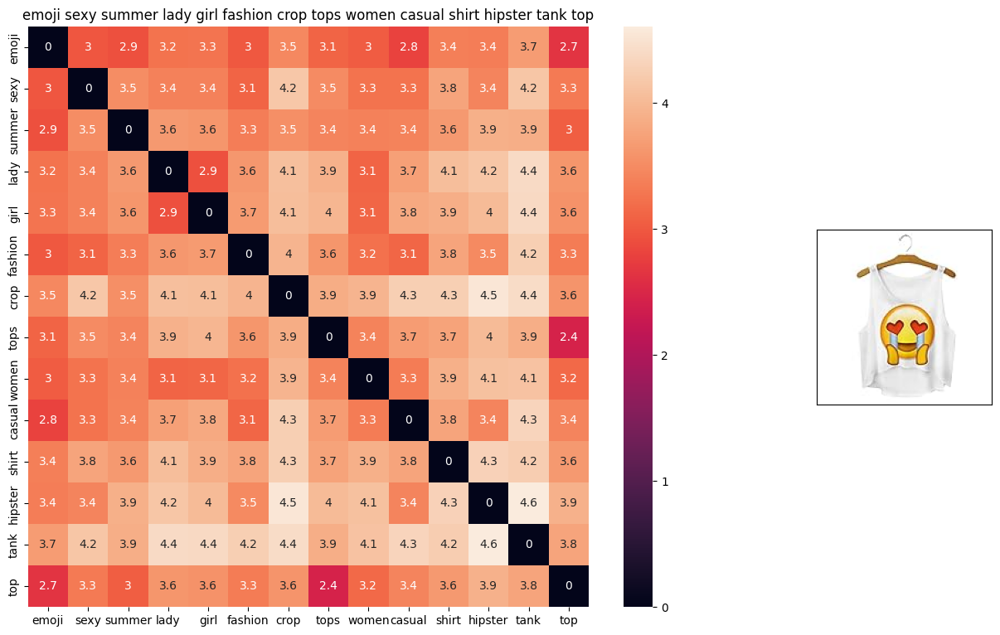

ASIN : B010V3BLWQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.0


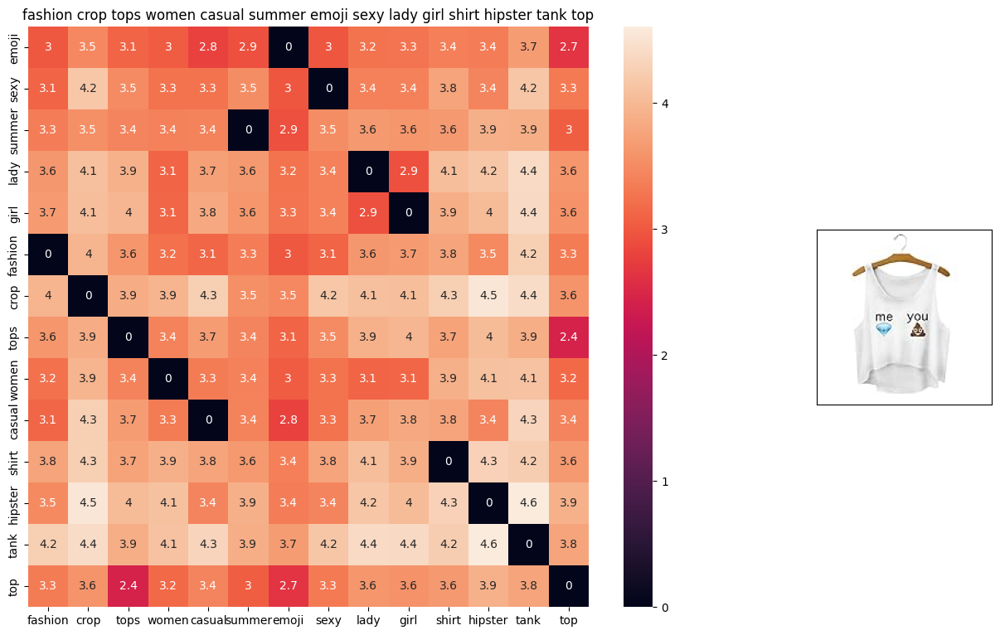

ASIN : B010V3B44G
BRAND : Doxi Supermall
euclidean distance from given input image : 2.9802322e-08


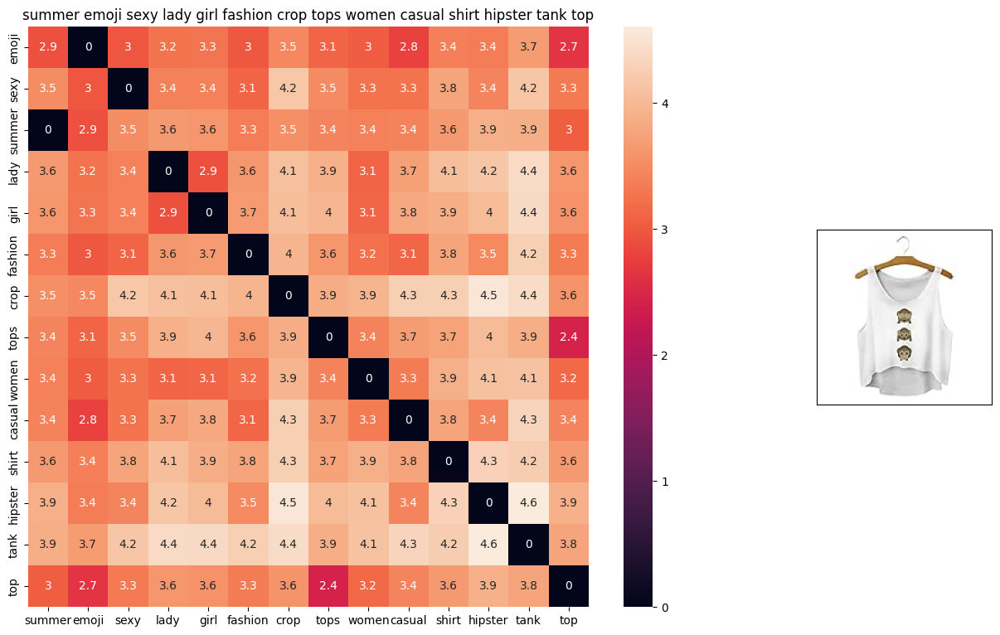

ASIN : B010V3BDII
BRAND : Doxi Supermall
euclidean distance from given input image : 2.9802322e-08


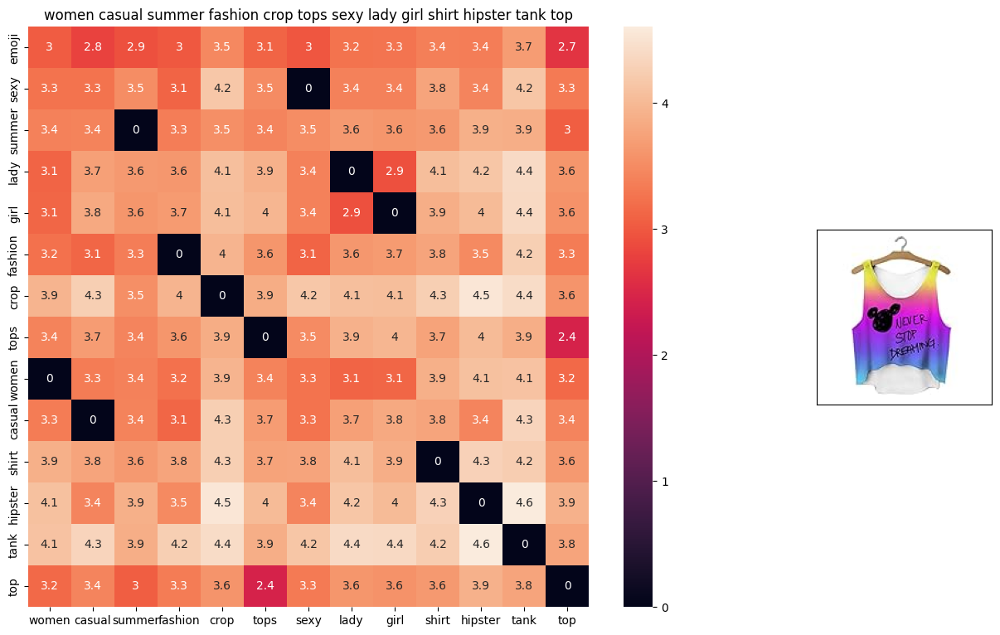

ASIN : B010V3AYSS
BRAND : Doxi Supermall
euclidean distance from given input image : 0.13368244


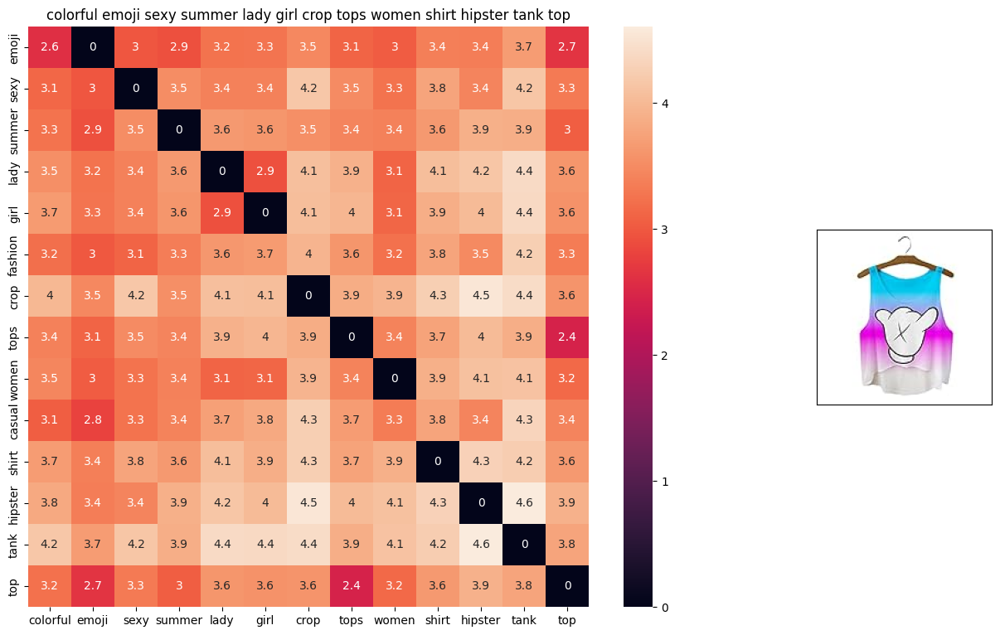

ASIN : B010V3BQZS
BRAND : Doxi Supermall
euclidean distance from given input image : 0.29837728


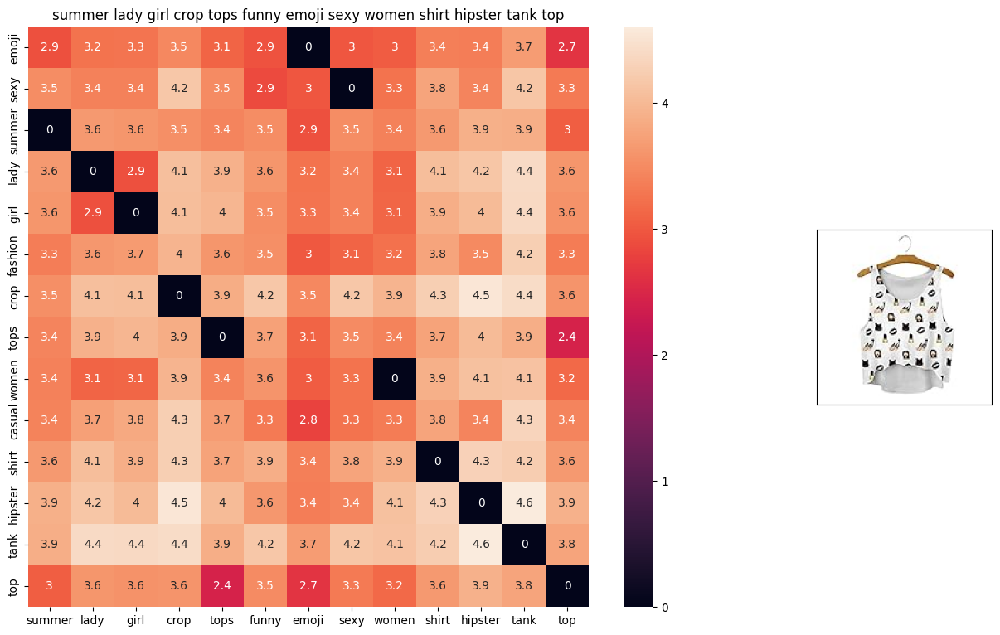

ASIN : B010V3BVMQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.3274634


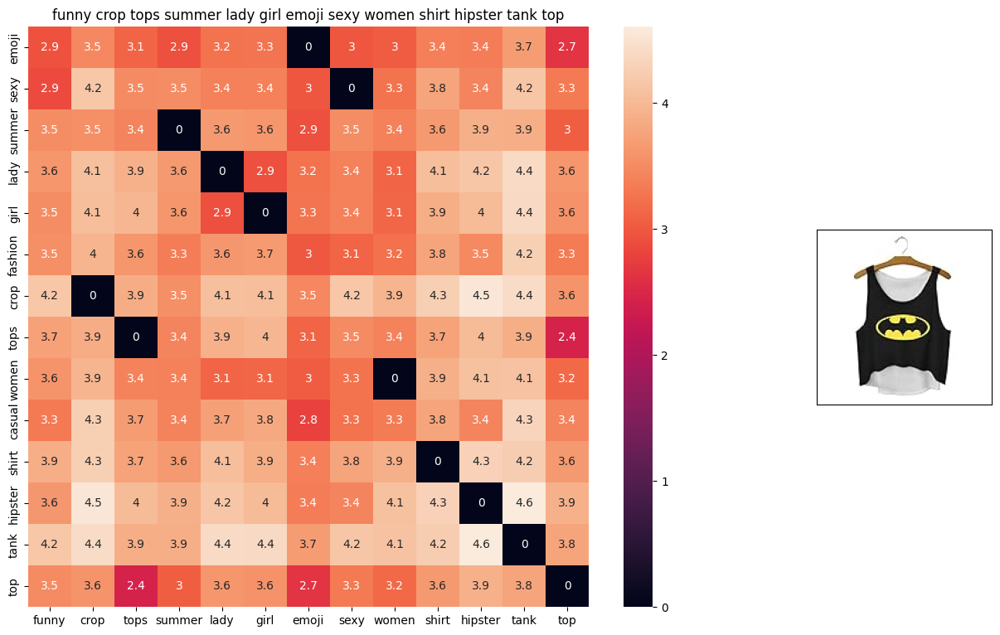

ASIN : B010V3C116
BRAND : Doxi Supermall
euclidean distance from given input image : 0.3274634


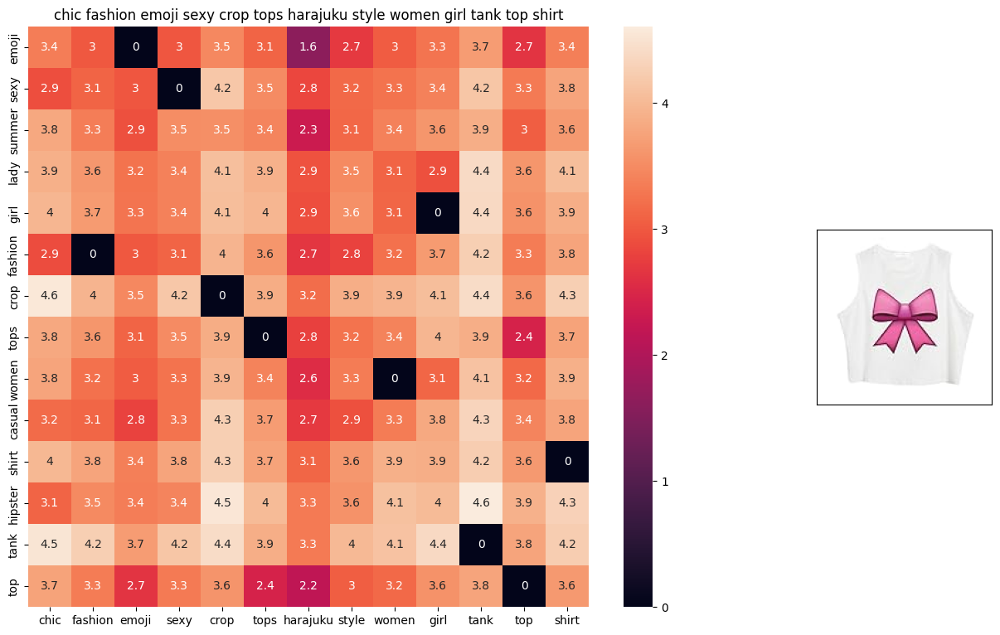

ASIN : B011RCJPR8
BRAND : Chiclook Cool
euclidean distance from given input image : 0.40975842


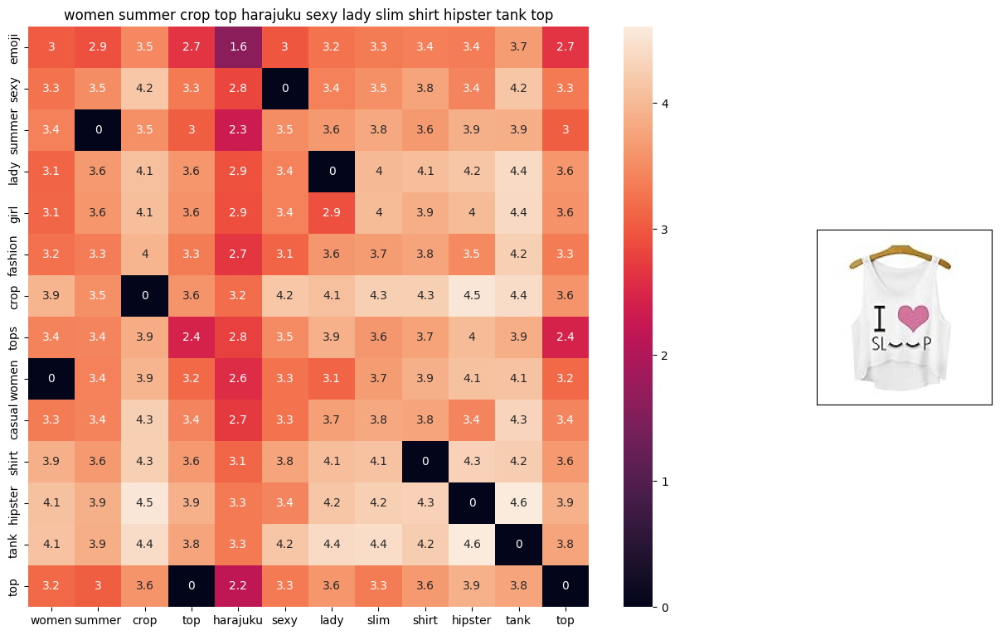

ASIN : B010V3EDEE
BRAND : Doxi Supermall
euclidean distance from given input image : 0.46806592


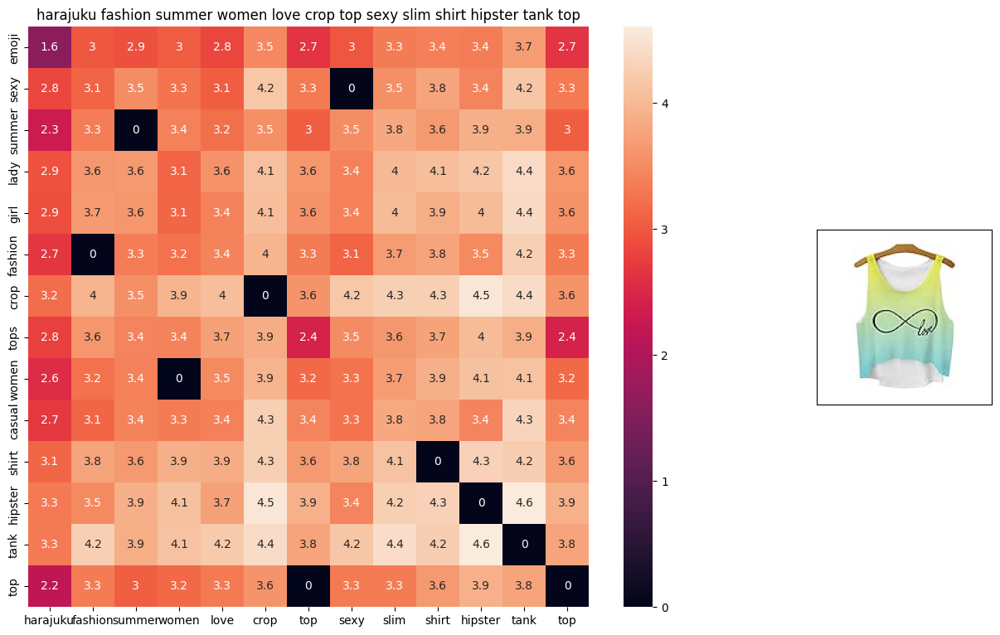

ASIN : B010V35OBU
BRAND : Doxi Supermall
euclidean distance from given input image : 0.4957314


In [ ]:
avg_w2v_model(12566, 10)

### [9.4]  IDF weighted Word2Vec for product similarity

In [ ]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc
w2v_title_weight = np.array(w2v_title_weight)

In [ ]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

# weighted_w2v_model(12566, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

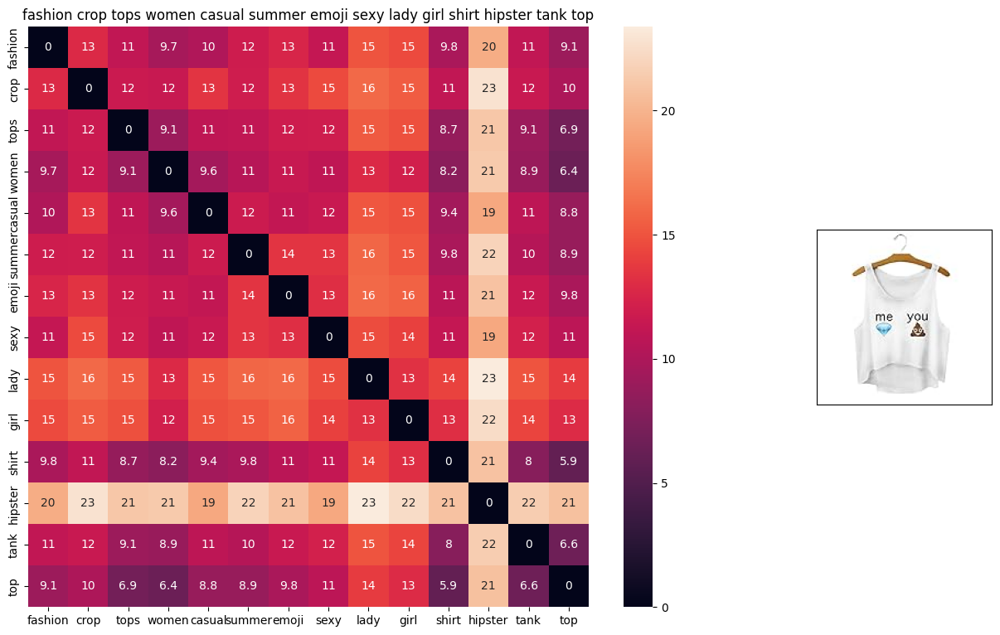

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


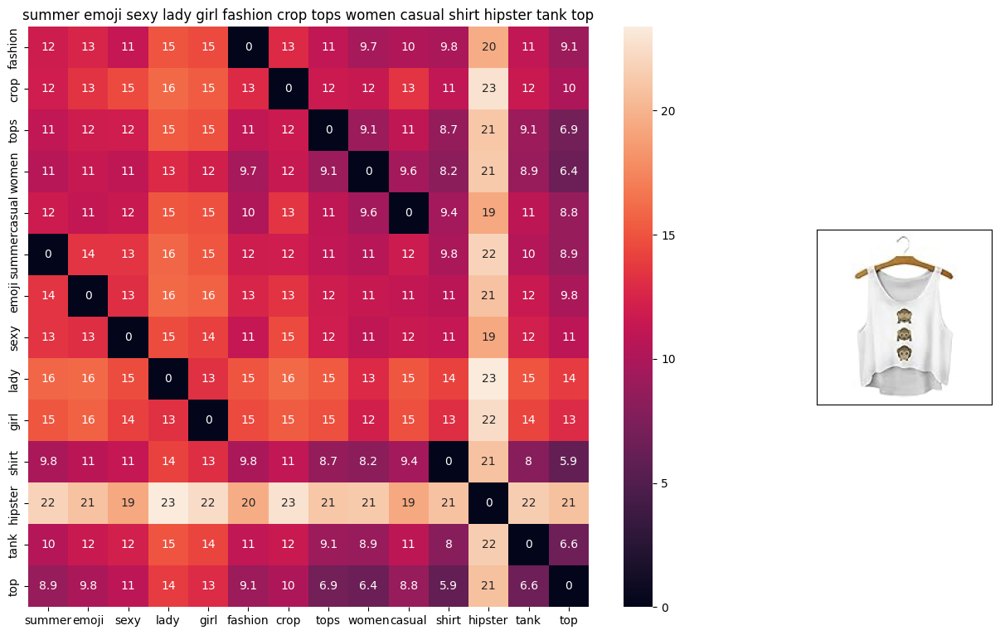

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 2.9200194e-07


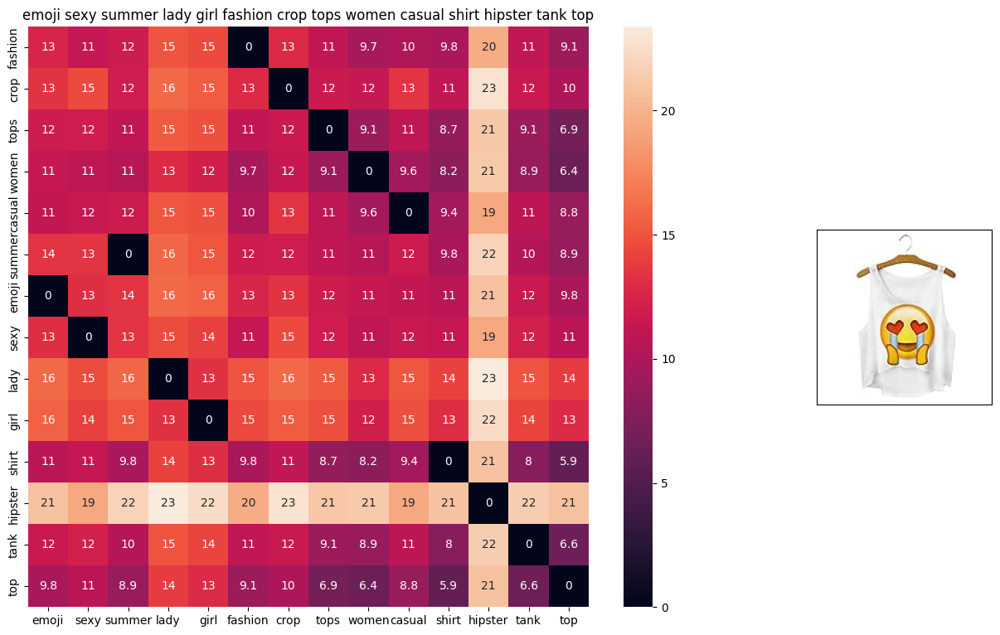

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 3.264681e-07


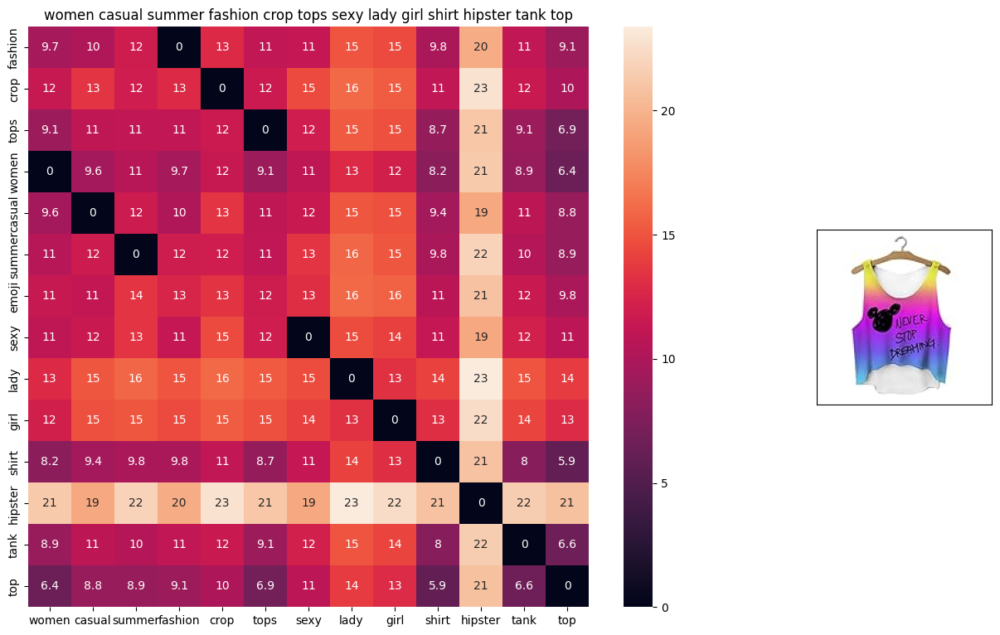

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from input : 0.6962319


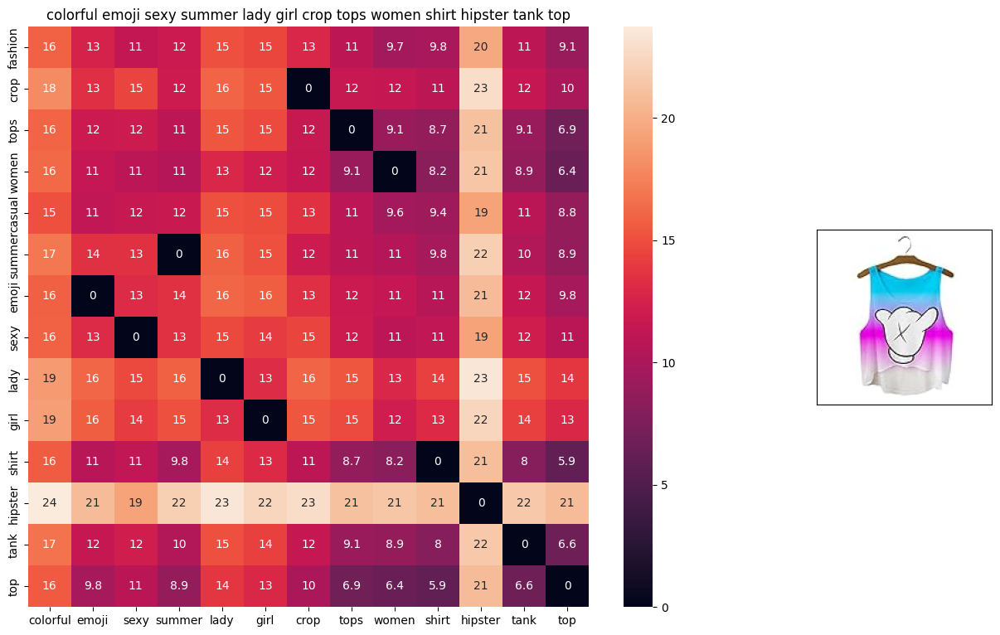

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from input : 1.2872719


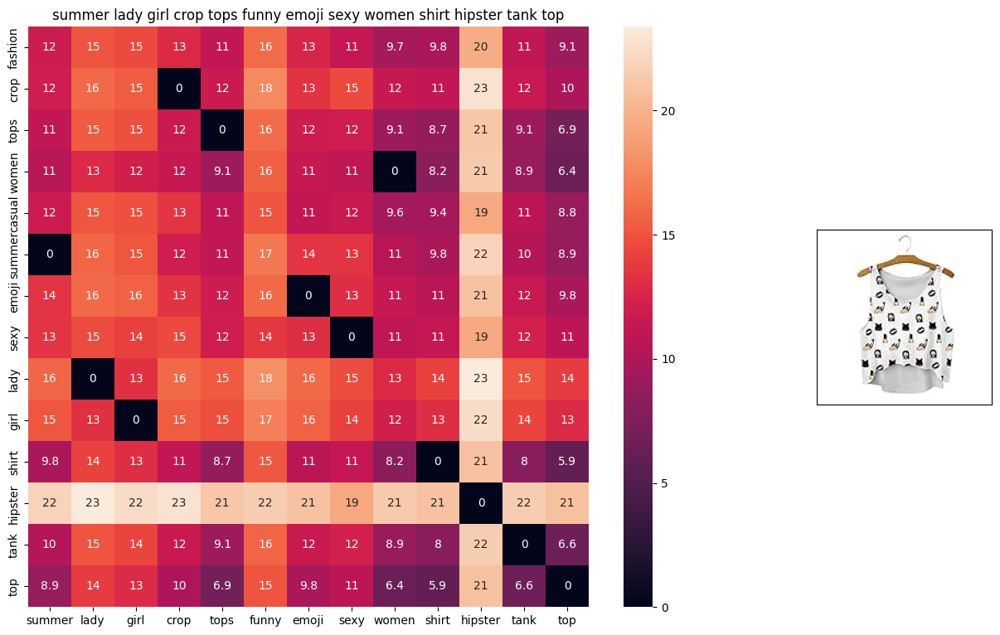

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 1.3530473


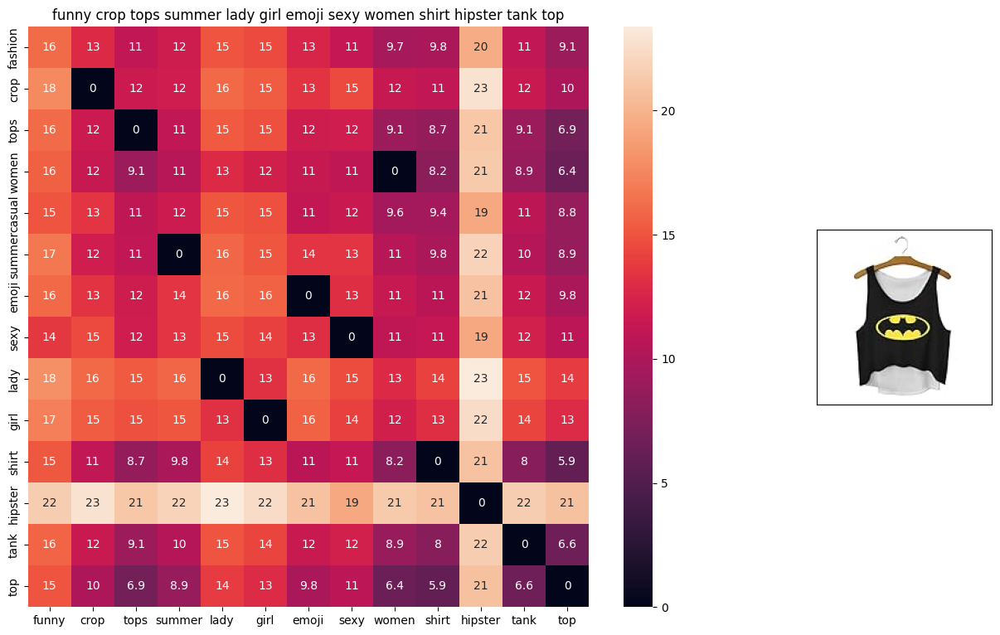

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from input : 1.3530474


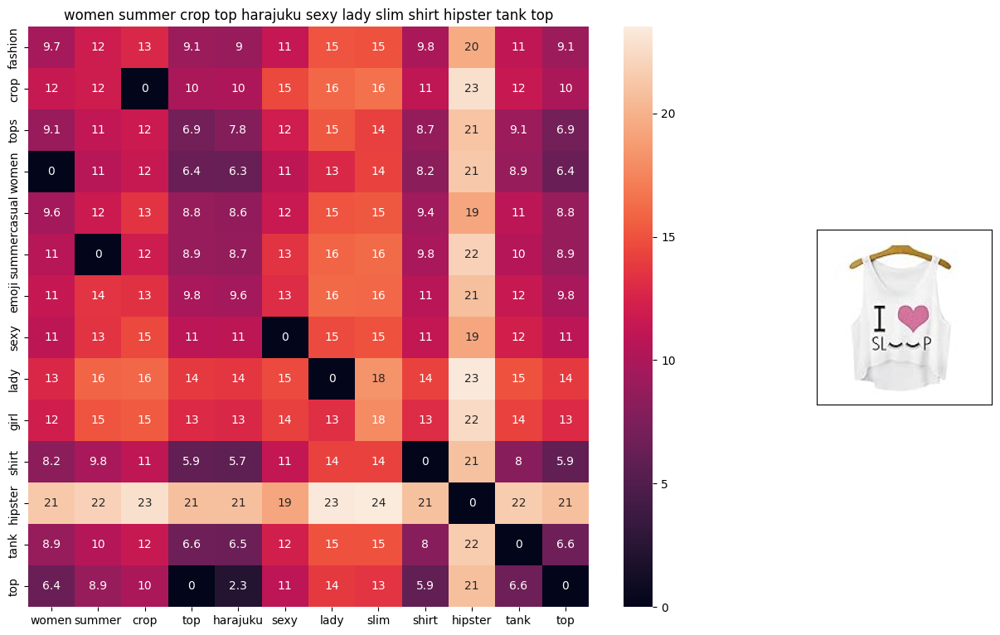

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from input : 1.7434151


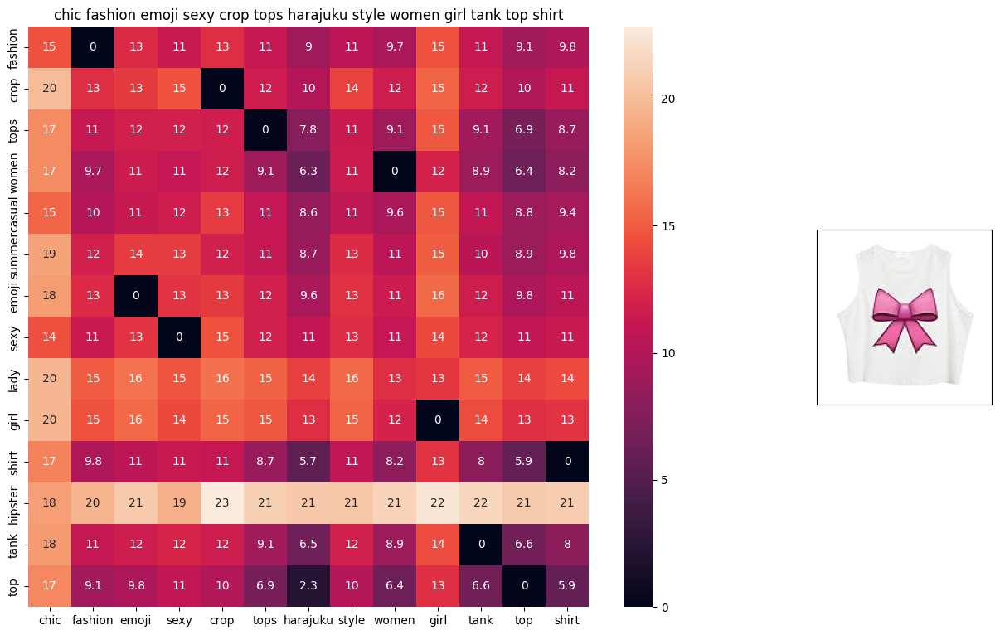

ASIN : B011RCJPR8
Brand : Chiclook Cool
euclidean distance from input : 1.934526


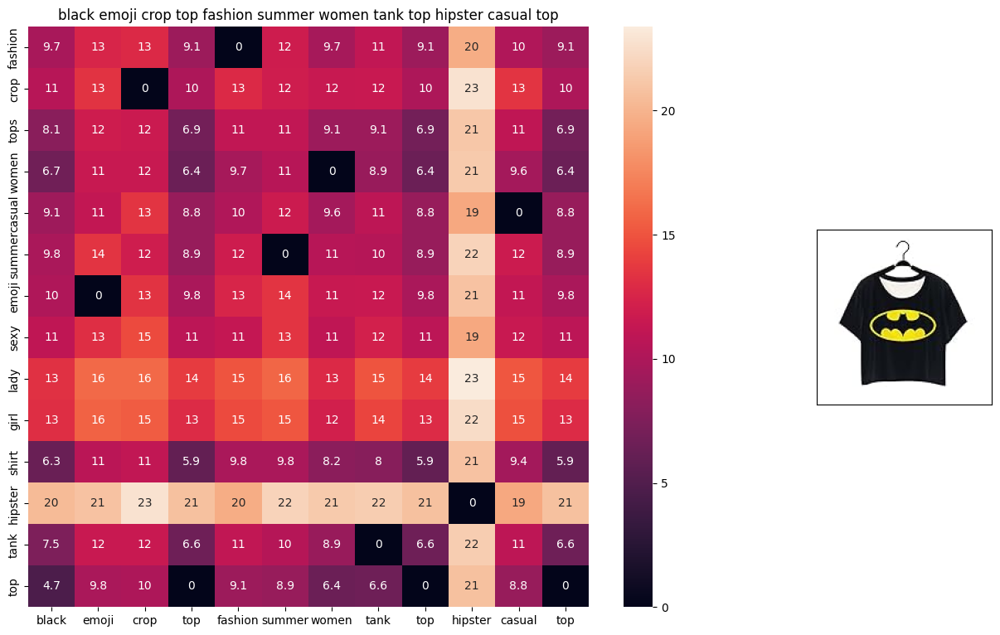

ASIN : B0124E80M4
Brand : Doxi Supermall
euclidean distance from input : 2.032144


In [ ]:
weighted_w2v_model(12566, 10)

### [9.6] Weighted similarity using brand and color.

In [ ]:
# some of the brand values are empty.
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [ ]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):

    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted

    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features

    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column

    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')

    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))

    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])

    # pass the url it display it
    display_img(url, ax2, fig)

    plt.show()

In [ ]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])


    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

# idf_w2v_brand(12566, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

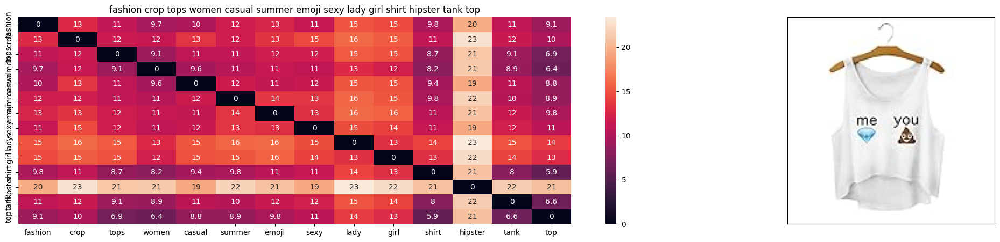

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


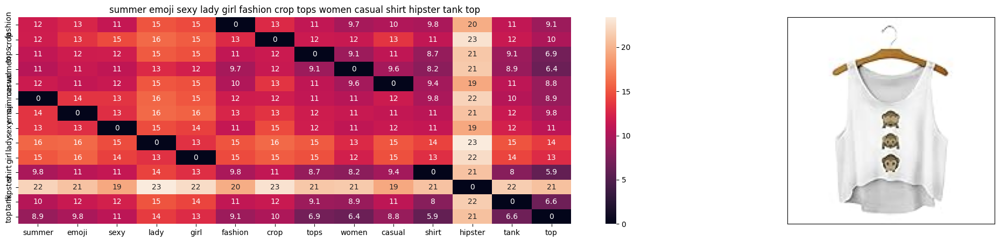

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 1.460009684706165e-07


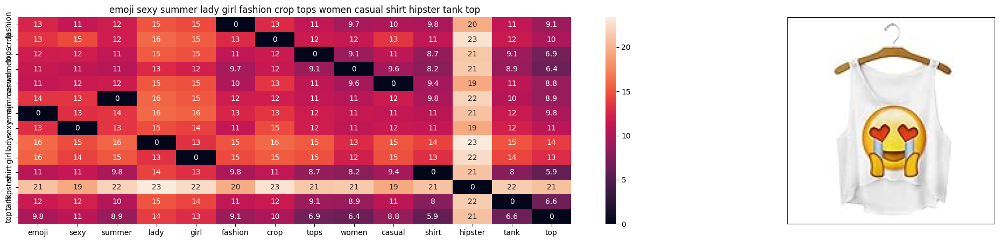

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 1.632340513424424e-07


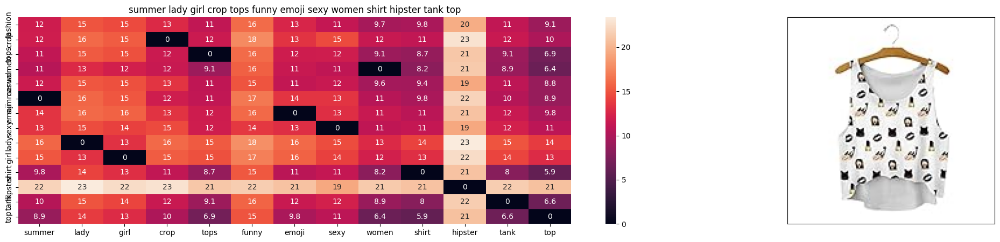

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 0.6765236377716064


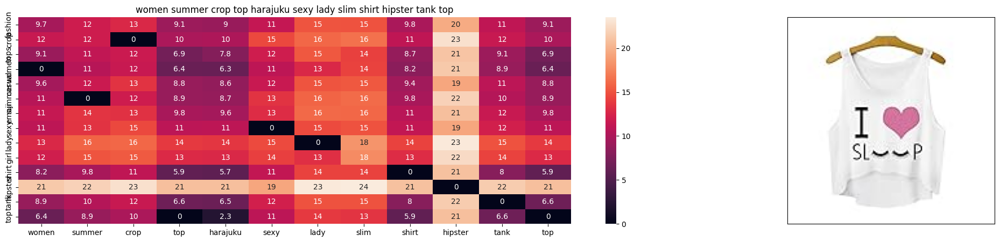

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from input : 0.871707534790039


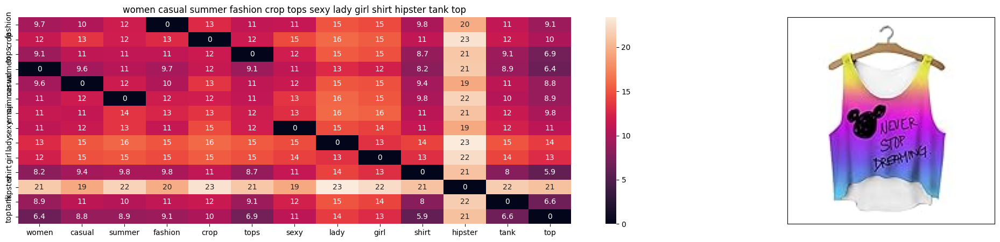

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from input : 1.0552227260489133


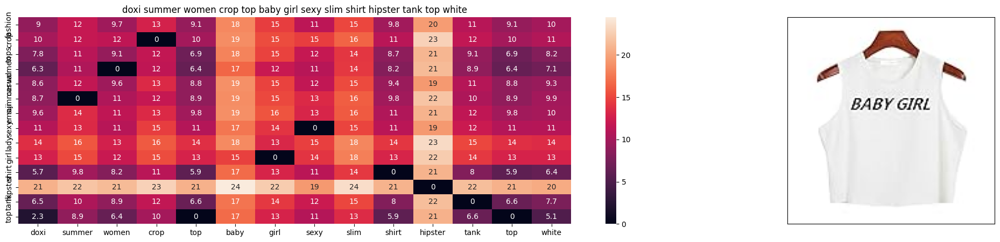

ASIN : B010V3A23U
Brand : Doxi Supermall
euclidean distance from input : 1.0621837615966796


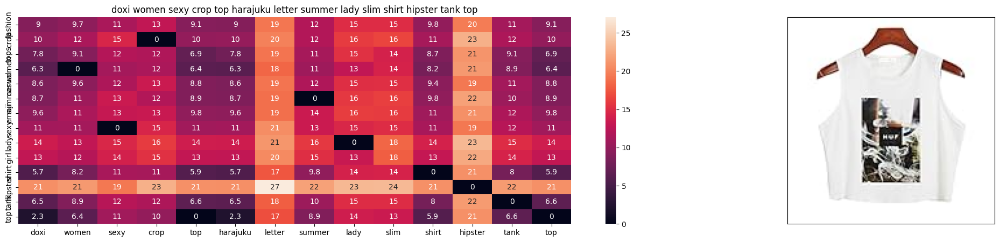

ASIN : B010V39146
Brand : Doxi Supermall
euclidean distance from input : 1.0837457656860352


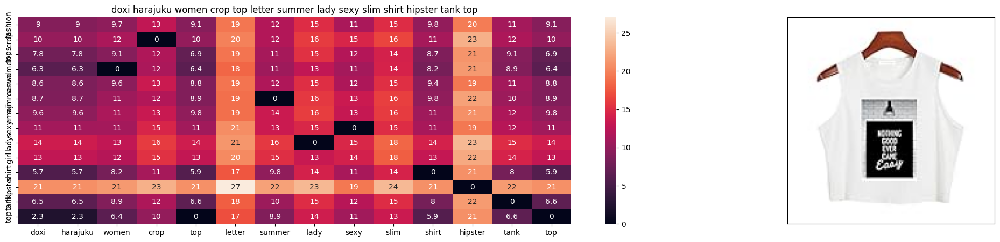

ASIN : B010V380LQ
Brand : Doxi Supermall
euclidean distance from input : 1.0837457656860352


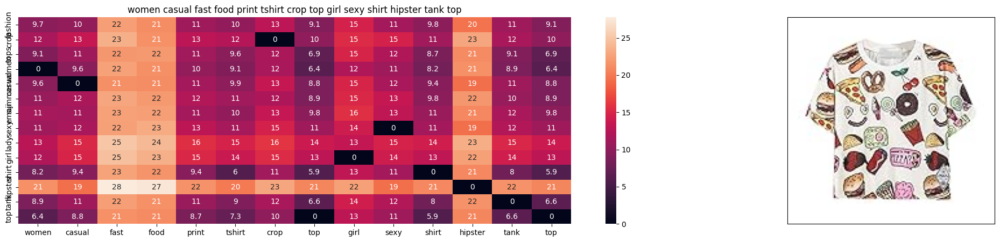

ASIN : B010V3AB5O
Brand : Doxi Supermall
euclidean distance from input : 1.3135894775390624


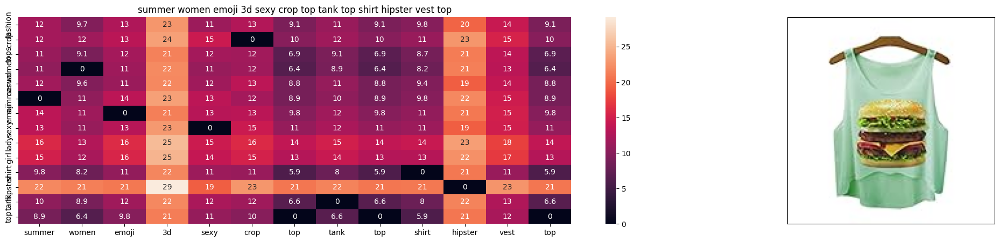

ASIN : B010V3E5EC
Brand : Doxi Supermall
euclidean distance from input : 1.3397350311279297


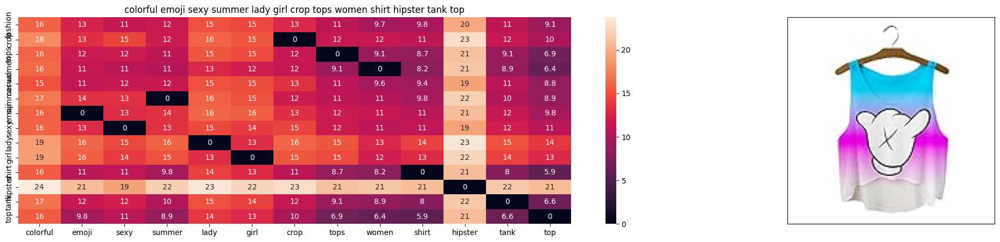

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from input : 1.3507427217383055


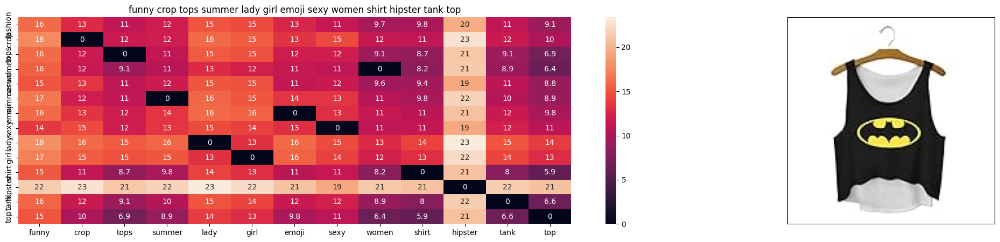

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from input : 1.3836304666418697


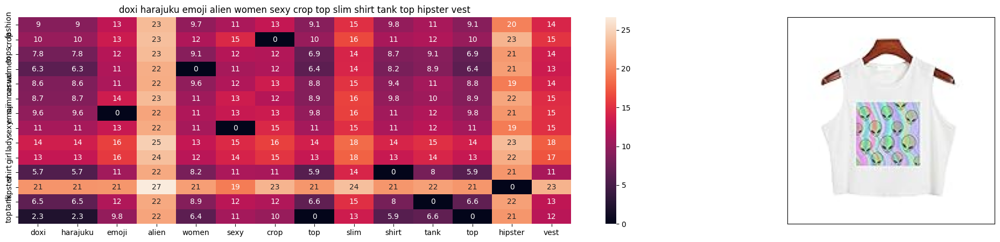

ASIN : B010TKXAI4
Brand : Doxi Supermall
euclidean distance from input : 1.387600803375244


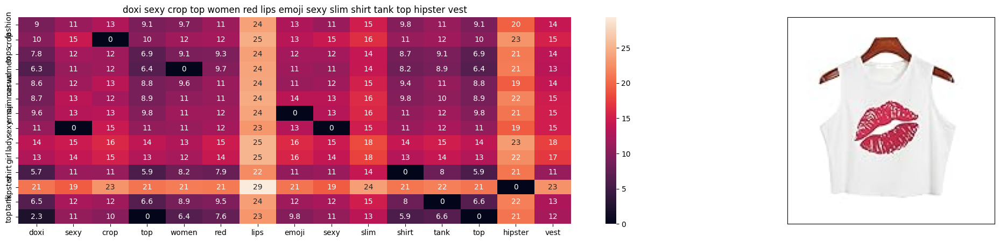

ASIN : B010TKXEHG
Brand : Doxi Supermall
euclidean distance from input : 1.4269560813903808


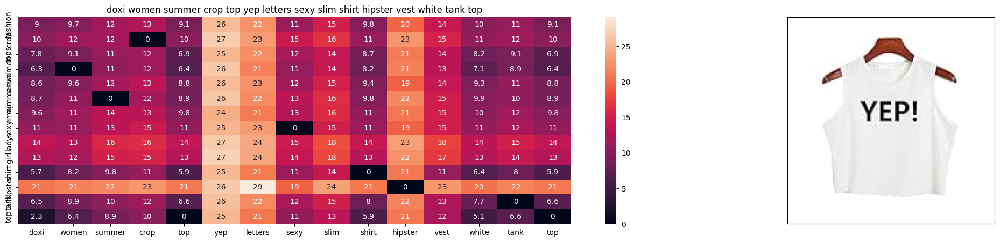

ASIN : B010V3487Q
Brand : Doxi Supermall
euclidean distance from input : 1.4681865692138671


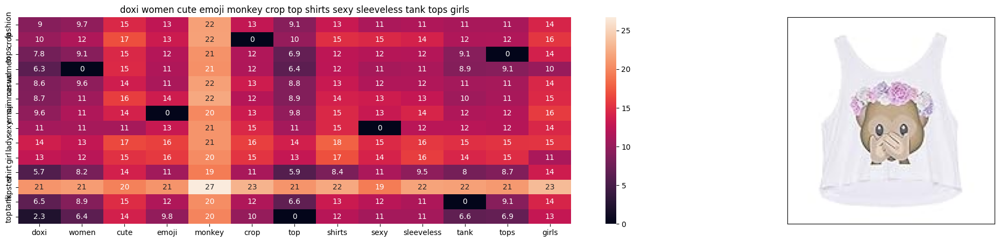

ASIN : B01LF90QTO
Brand : Doxi Supermall
euclidean distance from input : 1.4761534690856934


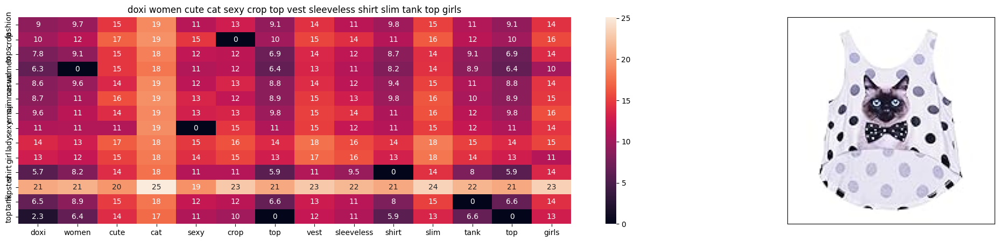

ASIN : B01LF90ROI
Brand : Doxi Supermall
euclidean distance from input : 1.482174777984619


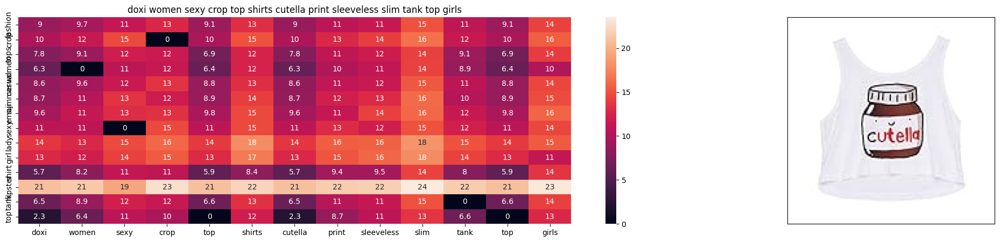

ASIN : B01LF90RKC
Brand : Doxi Supermall
euclidean distance from input : 1.5058938980102539


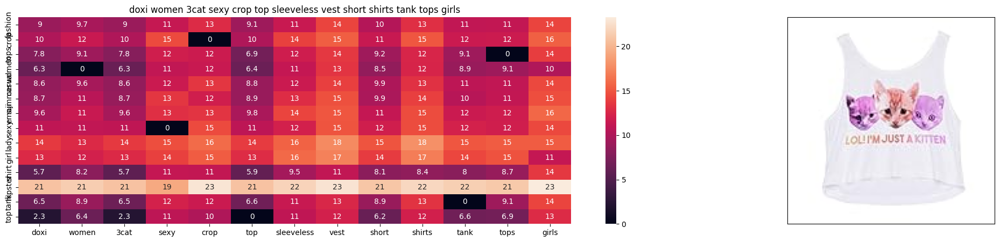

ASIN : B01LY4GQY0
Brand : Doxi Supermall
euclidean distance from input : 1.509817886352539


In [ ]:
idf_w2v_brand(12566, 5, 5, 20)

In [ ]:
# brand and color weight =50
# title vector weight = 5
# idf_w2v_brand(125, 5, 50, 10)

# [10.2] Keras and Tensorflow to extract features

In [ ]:
# pip install distutils

In [ ]:
# pip install tensorflow

In [ ]:
# pip install keras

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Use 'tensorflow.keras' instead of 'keras'
from tensorflow.keras.models import Sequential  # Use 'tensorflow.keras' instead of 'keras'
from tensorflow.keras.layers import Dropout, Flatten, Dense  # Use 'tensorflow.keras' instead of 'keras'
from tensorflow.keras import applications  # Use 'tensorflow.keras' instead of 'keras'
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle


In [ ]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html



# This code takes 40 minutes to run on a modern GPU (graphics card)
# like Nvidia  1050.
# GPU (NVidia 1050): 0.175 seconds per image

# This codse takes 160 minutes to run on a high end i7 CPU
# CPU (i7): 0.615 seconds per image.

#Do NOT run this code unless you want to wait a few hours for it to generate output

# each image is converted into 25088 length dense-vector


'''
# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():

    #Function to compute VGG-16 CNN for image feature extraction.

    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)

    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))

    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))


save_bottlebeck_features()

'''
""

''

In [ ]:
url = "https://drive.google.com/file/d/11JIaaADer78JI2O3jKE9wGVS85GfZmCr/view?usp=drive_link"
file_id = url.split('/')[5]
download_url = f'https://drive.google.com/uc?id={file_id}'
output = '16k_data_cnn_features.npy'
gdown.download(download_url, output, quiet=False)

print("16k_data_cnn_features.npy : Loaded Successful")


url = "https://drive.google.com/file/d/1G4dUeQDC6tWn5IZ78HJai8ExCliGlAGe/view?usp=sharing"
file_id = url.split('/')[5]
download_url = f'https://drive.google.com/uc?id={file_id}'
output = '16k_data_cnn_feature_asins.npy'
gdown.download(download_url, output, quiet=False)
print("16k_data_cnn_feature_asins.npy : Loaded Successful")

Downloading...
From (original): https://drive.google.com/uc?id=11JIaaADer78JI2O3jKE9wGVS85GfZmCr
From (redirected): https://drive.google.com/uc?id=11JIaaADer78JI2O3jKE9wGVS85GfZmCr&confirm=t&uuid=751f2ce4-5184-480f-8699-dc0d0463a88b
To: /content/16k_data_cnn_features.npy
100%|██████████| 1.61G/1.61G [00:17<00:00, 91.7MB/s]


16k_data_cnn_features.npy : Loaded Successful


Downloading...
From: https://drive.google.com/uc?id=1G4dUeQDC6tWn5IZ78HJai8ExCliGlAGe
To: /content/16k_data_cnn_feature_asins.npy
100%|██████████| 642k/642k [00:00<00:00, 135MB/s]

16k_data_cnn_feature_asins.npy : Loaded Successful


# [10.3] Visual features based product similarity.

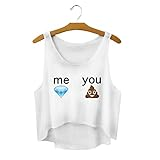

Product Title:  fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top
Euclidean Distance from input image: 6.67572e-06
Amazon Url: www.amazon.com/dp/B010V3B44G


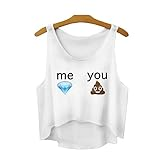

Product Title:  chic women harajuku fashion funny emoji sexy crop tops sleeveless vest shirt
Euclidean Distance from input image: 18.585749
Amazon Url: www.amazon.com/dp/B011RCJNL6


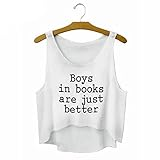

Product Title:  women quotes boys print white sleeveless crop top
Euclidean Distance from input image: 22.04546
Amazon Url: www.amazon.com/dp/B0748CKWF3


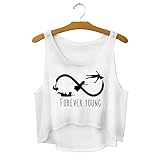

Product Title:  women forever young print white sleeveless crop top
Euclidean Distance from input image: 22.321218
Amazon Url: www.amazon.com/dp/B0748CDWPH


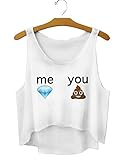

Product Title:  kingde self confident stretch vest tshirt suspendersbqn46
Euclidean Distance from input image: 22.724632
Amazon Url: www.amazon.com/dp/B015H2R3SC


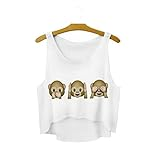

Product Title:  women three wise monkeys emoji print sleeveless crop top
Euclidean Distance from input image: 24.452633
Amazon Url: www.amazon.com/dp/B074VPC98H


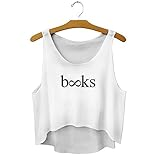

Product Title:  women infinity books print white sleeveless crop top
Euclidean Distance from input image: 25.067362
Amazon Url: www.amazon.com/dp/B074TYKHPL


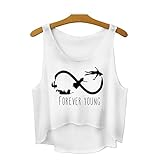

Product Title:  ladies crop top emoji women never grow shirt vest style tank tops
Euclidean Distance from input image: 26.787249
Amazon Url: www.amazon.com/dp/B013SPUM7O


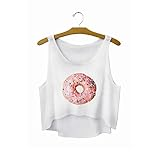

Product Title:  women fashion giant pink donut printed white sleeveless crop top
Euclidean Distance from input image: 28.364748
Amazon Url: www.amazon.com/dp/B017Q4BOCA


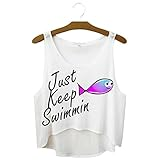

Product Title:  women keep swimming print sleeveless crop top
Euclidean Distance from input image: 29.022312
Amazon Url: www.amazon.com/dp/B0749CCCY4


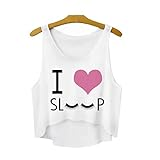

Product Title:  women summer crop top harajuku sexy lady slim shirt hipster tank top
Euclidean Distance from input image: 29.029295
Amazon Url: www.amazon.com/dp/B010V3EDEE


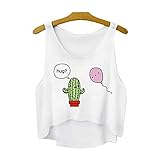

Product Title:  women fashion wanna hug printed white sleeveless crop top
Euclidean Distance from input image: 29.049513
Amazon Url: www.amazon.com/dp/B017R0CDOQ


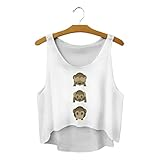

Product Title:  summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top
Euclidean Distance from input image: 29.482378
Amazon Url: www.amazon.com/dp/B010V3BDII


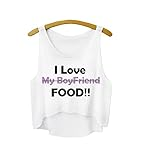

Product Title:  women fashion love food printed white crop top
Euclidean Distance from input image: 29.615349
Amazon Url: www.amazon.com/dp/B017K0DQZ8


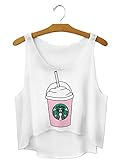

Product Title:  kingde slim starbucks coffee small vest tshirt sling stretchbqn53
Euclidean Distance from input image: 29.690027
Amazon Url: www.amazon.com/dp/B015H2QWY8


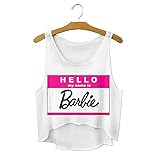

Product Title:  women fashion cute word printed name barbie sleeveless crop top
Euclidean Distance from input image: 29.862371
Amazon Url: www.amazon.com/dp/B01AK8SC10


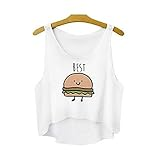

Product Title:  women fashion best friends printed best pattern one sleeveless crop top
Euclidean Distance from input image: 29.954865
Amazon Url: www.amazon.com/dp/B01GFJOGUE


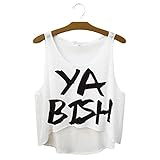

Product Title:  women yabish print white sleeveless crop top
Euclidean Distance from input image: 30.084488
Amazon Url: www.amazon.com/dp/B0748JNFL9


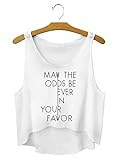

Product Title:  women fashion cool quote printed sleeveless crop top
Euclidean Distance from input image: 30.100615
Amazon Url: www.amazon.com/dp/B018RVK1FM


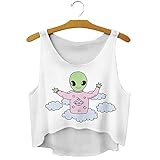

Product Title:  women pattern 8 cute baby alien print sleeveless crop top
Euclidean Distance from input image: 30.18043
Amazon Url: www.amazon.com/dp/B074BNJM8S


In [ ]:
import pickle as pl
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import pairwise_distances
from IPython.display import display, Image

# Load bottleneck features
bottleneck_features_train = np.load('16k_data_cnn_features.npy')

# Load ASINs with allow_pickle=True
asins = np.load('16k_data_cnn_feature_asins.npy', allow_pickle=False)
asins = list(asins)

# Load preprocessed data
data = pd.read_pickle('pickles/16k_apperal_data_preprocessed.pkl')
df_asins = list(data['asin'])

def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amazon.com/dp/' + asins[indices[i]])

# Example usage
get_similar_products_cnn(12566, 20)

---
---

### CaseStudy Flow:

---
---

- The objective of case study is to recommend similar apparel products(women's top)
- The data was obtained from **Amazon Product advertising API.**
- Total **183k data point was obtained with 19 features** such as asin,author,availability,availability_type,  brand, color  formatted_price etc.,
- We are considering only 9 features.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes )
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of product)
- Data pre-processing and cleaning was done. Null values for brand,color  was replaced with hypen.
- EDA was done on title of product to remoove similar/analogus titles.
- Final dataframe contains 16k data points with 9 features.
- Categorical features were one hot encoded with the help of countvectorizer.
- Text feature was encoded using bow,tfidf,avg_w2v and tfidf_avg_w2v.
- Similar products based on text was shown to check weather it is working correctly or not.
- **VGG16** was used to extract **feature from product images**.
- Combination of weighted vector [text + (brand + color) + image ] is used to get similar products.
- Observation are noted down whenever necessary.
- Results of case study is summarized at the end.
